# Deriving stationary shapes of vesicles using spontaneous-curvature model

In [36]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from JSAnimation import IPython_display 
from sympy import *
from scipy.integrate import solve_bvp, solve_ivp, quad

# init_printing()
%matplotlib notebook

## 1. Problem statement
According to the spontaneous-curvature model [1], the bending energy of a vesicle with surface area $A$ and volume $V$ is given by 
$$F_b \equiv \frac{\kappa}{2} \oint \left(C_1 + C_2 - C_0\right) dA + \kappa_G \oint C_1 C_2 dA$$
where $\kappa$ is the bending rigidity, $\kappa_G$ is the Gaussian bending rigidity, $C_1$ and $C_2$ are the two principal curvatures, $C_0$ is the spontaneous curvature accounting for a possible asymmetry of the bilayer membrane. 

The second term which represents the integrated Gaussian curvature can be omitted if we focus on shapes sharing the topology as a sphere. This gives
$$F_b = \frac{\kappa}{2} \oint \left(C_1 + C_2 - C_0\right)^2 dA $$

Our goal is to determine the vesicle shape of the lowest bending energy for a given area $A$ and volume $V$. 

We do this via Lagrange multipliers. Introducing the multipliers $\Sigma$ and $P$, we obtain  
$$ \delta F \equiv \delta \left( F_b + \Sigma A + P V\right) = 0$$
where $\delta$ denotes variation with respect to the shape. From this equation, the shape equations can be derived. 

To simplify the search, we restrict the solutions to axisymmetric shapes. We can parameterize this shape with coordinates $(S, \phi)$. Here $S$ denotes the arclength along the contour measured from the north pole of the shape, $\phi$ is the azimuthal angle. The shape is described by the tilt angle $\psi(S, \phi)$. Since the shape is axisymmetric by assumption, the dependence on $\phi$ can be removed. See Figure 1 in [1] for details. We also use the coordinates $X$ and $Z$ which are perpendicular and parallel to the axis of symmetry respectively. The shape can also be parameterized with $Z(X)$. 

With this system of parameterization, there exist the following geometrical relations: 
\begin{align}
    \dot{X} &\equiv \frac{d X}{d S} = \cos \psi \\
    \dot{Z} &\equiv \frac{d Z}{d S} = -\sin \psi \\
    C_1 &= \dot{\psi} \equiv \frac{d \psi}{d S} \\
    C_2 &= \frac{\sin \psi}{X} \\
\end{align}

The total energy $F$ can be expressed as 
$$ F = 2\pi\kappa \int_0^{S_1} L\left(\psi, \dot{\psi}, X, \dot{X}, \gamma \right) dS$$
with the Lagrange function 
$$ L\equiv \frac{X}{2} \left[\dot{\psi}+\frac{\sin\psi}{X}-C_0\right]^2 + \overline{\Sigma}X + \frac{\overline{P}}{2}X^2 \sin\psi + \gamma \left(\dot{X}-\cos\psi \right)$$
$$ \overline{\Sigma} \equiv \frac{\Sigma}{\kappa}$$
$$ \overline{P} \equiv \frac{P}{\kappa}$$
The term $\gamma=\gamma(S)$ is the Lagrange parameter function. 

The Euler-Lagrange equations for the $F$ give rise to the shape equations
\begin{align}
    \dot{\psi} &= U \\
    \dot{U} &= -\frac{U}{X}\cos{\psi} + \frac{\cos{\psi}\sin{\psi}}{X^2} + \frac{\gamma}{X}\sin{\psi} + \frac{\overline{P}X}{2}\cos{\psi} \\
    \dot{\gamma} &= \frac{\left(U-C_0\right)^2}{2} - \frac{\sin^2{\psi}}{2 X^2} + \overline{P}X\sin{\psi} + \overline{\Sigma} \\
    \dot{X} &= \cos{\psi}
\end{align}
with boundary conditions 
\begin{align}
    \psi\left(0\right) &= 0 \\
    \psi\left(S_1\right) &= \pi \\
    X\left(0\right) &= 0 \\
    X\left(S_1\right) &= 0 \\
    \gamma\left(0\right) &= 0 \\
    \gamma\left(S_1\right) &= 0 \\
\end{align}

### *Reference*

[1] Seifert, Udo, Karin Berndl, and Reinhard Lipowsky. "Shape transformations of vesicles: Phase diagram for spontaneous-curvature and bilayer-coupling models." Physical Review A 44.2 (1991): 1182.

## 2. Derivation of the shape equations  

In [2]:
S = Symbol(r'S')
psi = Function(r'\psi')
X = Function(r'X')
gamma = Function(r'\gamma')

C0, SigmaBar, PBar = symbols(r'C_0 \overline{\Sigma} \overline{P}')

Define the Lagrangian,

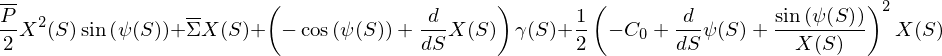

In [3]:
L = X(S)/2*(psi(S).diff(S)+sin(psi(S))/X(S)-C0)**2 + SigmaBar*X(S) + PBar/2*X(S)**2*sin(psi(S)) \
    + gamma(S)*(X(S).diff(S)-cos(psi(S)))
L

Use `euler_equations` to find the Euler-Lagrange equations,

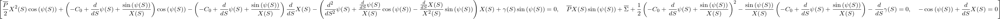

In [4]:
LEeqns = euler_equations(L, [psi(S), X(S), gamma(S)], S)
LEeqns

Simplify the Euler-Lagrange equations to get the shape equations, 

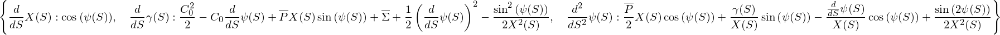

In [5]:
solve(LEeqns, [psi(S).diff(S).diff(S), gamma(S).diff(S), X(S).diff(S)])

## 3. Solve the system of ODEs numerically

Taylor expand around the origin 

In [6]:
S, psi, X, gamma = symbols(r'S \psi X \gamma')
C0, SigmaBar, PBar = symbols(r'C_0 \overline{\Sigma} \overline{P}')

In [15]:
n_terms = 3
a = [symbols('a'+str(i)) for i in range(1, n_terms+1)]
b = [symbols('b'+str(i)) for i in range(1, n_terms+1)]
c = [symbols('c'+str(i)) for i in range(1, n_terms+1)]

In [63]:
psi = sum(a[i]*S**(i+1) for i in range(n_terms))
X = sum(b[i]*S**(i+1) for i in range(n_terms))
gamma = sum(c[i]*S**(i+1) for i in range(n_terms))

In [17]:
shape_eqns = [
    psi.diff(S).diff(S) + psi.diff(S)/X*cos(psi) - cos(psi)*sin(psi)/X**2 - gamma/X*sin(psi) - PBar*X*cos(psi)/2, 
    gamma.diff(S) - (psi.diff(S)-C0)**2/2 + sin(psi)**2/(2*X**2) - PBar*X*sin(psi) - SigmaBar,
    X.diff(S) - cos(psi)
]

In [41]:
eq1_order0 = shape_eqns[0].series(S, 0, 1).removeO()
eq1_order1 = shape_eqns[0].series(S, 0, 2).removeO() - eq1_order0
eq2_order0 = shape_eqns[1].series(S, 0, 1).removeO()
eq2_order1 = shape_eqns[1].series(S, 0, 2).removeO() - eq2_order0
eq3_order0 = shape_eqns[2].series(S, 0, 1).removeO()
eq3_order1 = shape_eqns[2].series(S, 0, 2).removeO() - eq3_order0

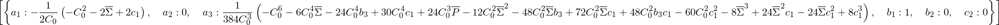

In [64]:
solve([eq1_order0, eq1_order1, eq2_order0, eq2_order1, eq3_order0, eq3_order1], set(a+b+c))

Hence, when $S$ is close to 0, 
$$\psi = a_1 S + \mathcal{O}\left( S^3\right)$$
$$X = S + \mathcal{O}\left( S^3\right)$$
$$\gamma = \left(\frac{C_0^2}{2}-C_0 a_1 + \overline{\Sigma}\right) S + \mathcal{O}\left( S^3\right)$$

In [3]:
def shape_func(S, y, Sigmabar, Pbar, C0):
    '''System of ODEs'''
    
    # Variables. psi and dpsi are viewed as two variables.
    (psi, dpsi, gamma, X) = y 

    ddpsi = -dpsi*np.cos(psi)/X + np.cos(psi)*np.sin(psi)/(X**2) + gamma*np.sin(psi)/X +  Pbar*X*np.cos(psi)/2
    dgamma = (dpsi-C0)**2/2 - np.sin(psi)**2/(2*X**2) + Pbar*X*np.sin(psi) + Sigmabar
    dX = np.cos(psi)
        
    # Return derivatives of every variable
    dy = (dpsi, ddpsi, dgamma, dX)
    
    return dy


def y0(S0, U0, Sigmabar, C0):
    '''Initial conditions'''
    
    return [U0*S0, U0, (C0**2/2-C0*U0+Sigmabar)*S0, S0]


def psi_reach_pi(S, y):
    '''Event function for detecting when psi reaches pi'''
    
    return y[0]-np.pi


def psi_reach_3pi(S, y): 
    '''Event function for detecting when psi reaches 3pi'''
    
    return y[0]-3*np.pi
psi_reach_3pi.terminal = True


def psi_reach_minus_2pi(S, y): 
    '''Event function for detecting when psi reaches -2pi'''
    
    return y[0]+2*np.pi
psi_reach_minus_2pi.terminal = True


def plot_solution(sols, labels):
    ylabels = [r'$\psi$', r'$\dot{\psi}$', r'$\gamma$', r'$X$']

    fig, axes = plt.subplots(1, 4, figsize=(14, 4))
    for i in range(4):
        for sol, label in zip(sols, labels):
            axes[i].plot(sol.t, sol.y[i], '.')
        if i == 0: 
            axes[i].axhline(y=np.pi, color='r', linestyle='--')
        axes[i].set_xlabel('S')
        axes[i].set_ylabel(ylabels[i])
        axes[i].legend(labels)
    plt.tight_layout()
    plt.show()

    
def generate_contour(sol):
    psi_of_S = lambda S: sol.sol(S)[0]
    X_of_S = lambda S: sol.sol(S)[3]
    Z_of_S = lambda S: quad(lambda s: -np.sin(psi_of_S(s)), 0, S)[0]
    
    if len(sol.t_events[0]) > 0: 
        ss = np.linspace(0, sol.t_events[0][-1], 100)
    else: 
        ss = np.linspace(0, sol.t[-1], 100)
        
    xx = np.array([X_of_S(S) for S in ss])
    zz = np.array([Z_of_S(S) for S in ss])
    
    return [xx, zz]
    
def plot_contour(coords):
    x, z = coords
    plt.plot(x, z, 'k-')
    plt.plot(-x, z, 'k-')
#     plt.xlabel('X')
#     plt.ylabel('Z')
    plt.axis('equal')
    plt.axis('off')

In [3]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.
U0 = 1.


sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 

In [4]:
sol.t_events

[array([ 7.4295712 ,  9.11276894, 15.97500118]),
 array([29.82564181]),
 array([], dtype=float64)]

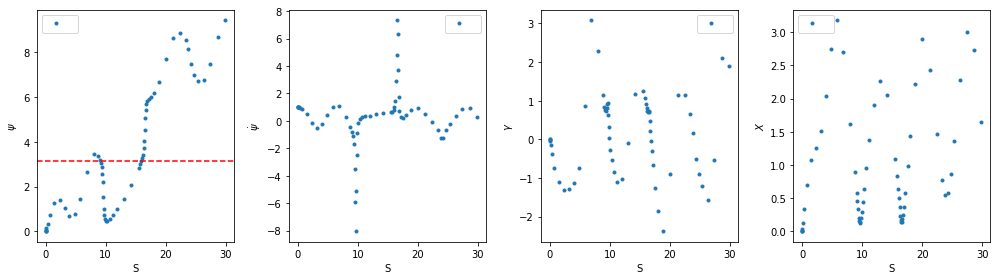

In [5]:
plot_solution([sol], [None])

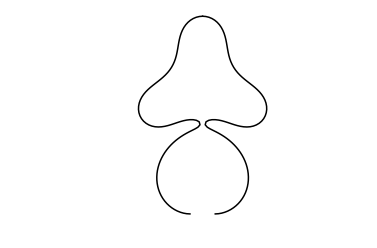

In [6]:
plot_contour(generate_contour(sol))

try various small $S_0$

In [7]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0_list = [1e-3, 1e-5, 1e-7, 1e-9]
S1 = 30.
U0 = 1.

sols = []
for S0 in S0_list:
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), 
                    method='RK45', events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    sols.append(sol)

In [9]:
for sol in sols: 
    print(sol.t_events)

[array([ 7.43829814,  9.14876039, 15.94893327]), array([29.65134344]), array([], dtype=float64)]
[array([ 7.42942544,  9.1118509 , 15.9736874 ]), array([29.79029414]), array([], dtype=float64)]
[array([ 7.4295712 ,  9.11276894, 15.97500118]), array([29.82564181]), array([], dtype=float64)]
[array([ 7.42957276,  9.11277931, 15.97501332]), array([29.82560478]), array([], dtype=float64)]


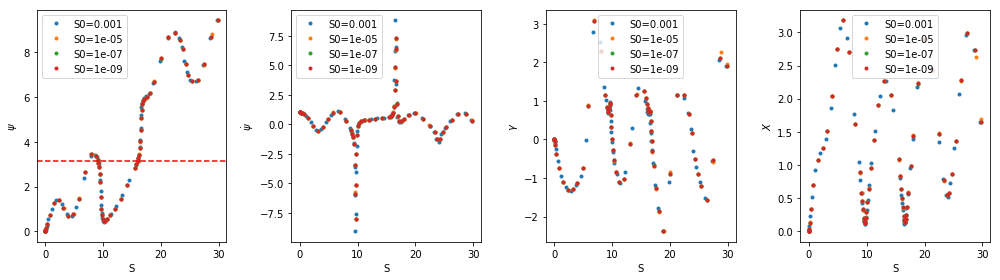

In [8]:
plot_solution(sols, ['S0='+str(S0) for S0 in S0_list])

### Reproduce Figure 16 

In [38]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 100
U0_list = np.linspace(-1, 1, 501)

sols = []
for U0 in U0_list:
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi])
    sols.append(sol)

In [11]:
for i, sol in enumerate(sols): 
    print(i, sol.t_events)

0 [array([8.73987007]), array([18.37767517]), array([], dtype=float64)]
1 [array([8.74112826]), array([18.37263092]), array([], dtype=float64)]
2 [array([8.74239704]), array([18.37268385]), array([], dtype=float64)]
3 [array([8.7436767]), array([18.37931822]), array([], dtype=float64)]
4 [array([8.74496753]), array([18.3809157]), array([], dtype=float64)]
5 [array([8.74626986]), array([18.37896263]), array([], dtype=float64)]
6 [array([8.74869213]), array([18.42277491]), array([], dtype=float64)]
7 [array([8.75011268]), array([18.42452188]), array([], dtype=float64)]
8 [array([8.75154068]), array([18.42355294]), array([], dtype=float64)]
9 [array([8.75297703]), array([18.42097954]), array([], dtype=float64)]
10 [array([8.7544226]), array([18.42194429]), array([], dtype=float64)]
11 [array([8.75587827]), array([18.42010022]), array([], dtype=float64)]
12 [array([8.75734492]), array([18.41456149]), array([], dtype=float64)]
13 [array([8.75882341]), array([18.41232593]), array([], dtype=f

338 [array([6.3271137]), array([20.03400495]), array([], dtype=float64)]
339 [array([6.33809623]), array([19.98142333]), array([], dtype=float64)]
340 [array([6.34823645]), array([19.95748567]), array([], dtype=float64)]
341 [array([6.36499388]), array([19.97276938]), array([], dtype=float64)]
342 [array([6.37905328]), array([19.96755537]), array([], dtype=float64)]
343 [array([6.39033203]), array([19.91298976]), array([], dtype=float64)]
344 [array([6.4039701]), array([19.90684428]), array([], dtype=float64)]
345 [array([6.41842237]), array([19.95322218]), array([], dtype=float64)]
346 [array([6.43350919]), array([19.95761293]), array([], dtype=float64)]
347 [array([6.44930377]), array([19.98693408]), array([], dtype=float64)]
348 [array([6.46526045]), array([19.9996999]), array([], dtype=float64)]
349 [array([6.4816279]), array([20.03511606]), array([], dtype=float64)]
350 [array([6.49872028]), array([20.10241773]), array([], dtype=float64)]
351 [array([6.51643358]), array([20.148447

In [12]:
nmax = max([len(sol.t_events[0]) for sol in sols])
print(nmax)

5


In [15]:
U0_list[255]

0.020000000000000018

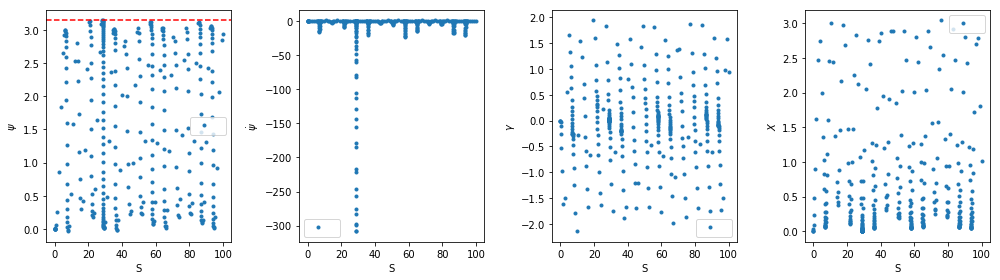

In [13]:
plot_solution([sols[255]], [None])

/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/scipy/integrate/quadpack.py:385: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  warnings.warn(msg, IntegrationWarning)


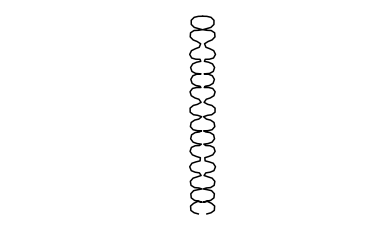

In [14]:
plot_contour(generate_contour(sols[255]))

In [40]:
U0_n_geq1 = np.array([U0 for sol, U0 in zip(sols, U0_list) if len(sol.t_events[0]) > 0])
U0_n_geq2 = np.array([U0 for sol, U0 in zip(sols, U0_list) if len(sol.t_events[0]) > 1]) 
U0_n_geq3 = np.array([U0 for sol, U0 in zip(sols, U0_list) if len(sol.t_events[0]) > 2]) 

S1_n_geq1 = np.array([sol.t_events[0] for sol in sols if len(sol.t_events[0]) > 0])
S1_n_geq2 = np.array([sol.t_events[0] for sol in sols if len(sol.t_events[0]) > 1])
S1_n_geq3 = np.array([sol.t_events[0] for sol in sols if len(sol.t_events[0]) > 2])

y_n_geq1 = np.array([sol.sol(sol.t_events[0])[:, 0] for sol in sols if len(sol.t_events[0]) > 0])
y_n_geq2 = np.array([sol.sol(sol.t_events[0])[:, 1] for sol in sols if len(sol.t_events[0]) > 1])
y_n_geq3 = np.array([sol.sol(sol.t_events[0])[:, 2] for sol in sols if len(sol.t_events[0]) > 2])

print(U0_n_geq1.shape, S1_n_geq1.shape, y_n_geq1.shape)
print(U0_n_geq2.shape, S1_n_geq2.shape, y_n_geq2.shape)
print(U0_n_geq3.shape, S1_n_geq3.shape, y_n_geq3.shape)


(498,) (498,) (498, 4)
(49,) (49,) (49, 4)
(46,) (46,) (46, 4)


<IPython.core.display.Javascript object>


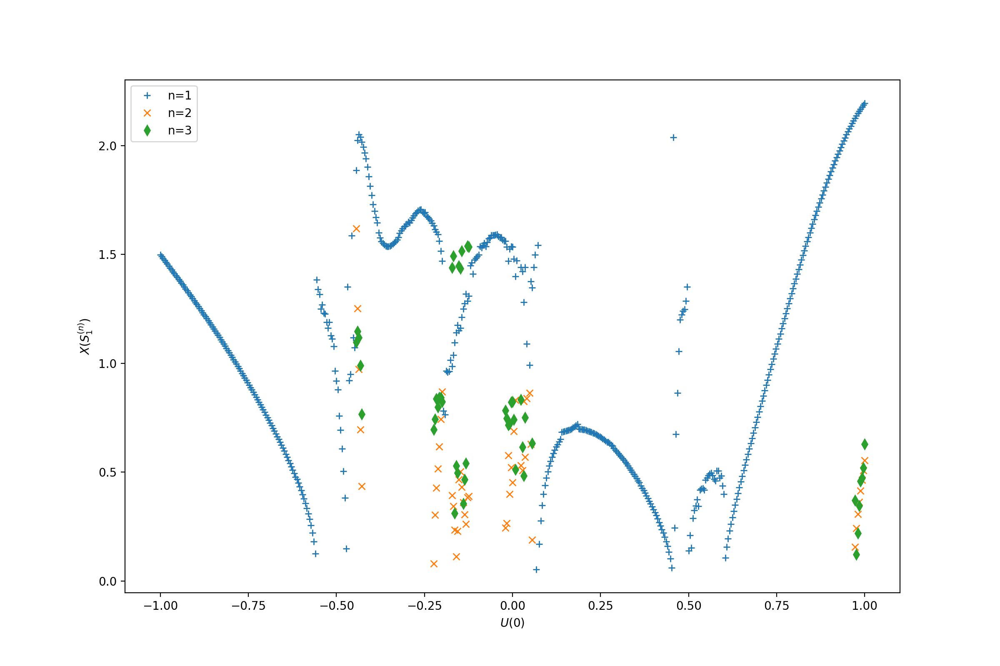

In [42]:
plt.figure(figsize=(12, 8))
plt.plot(U0_n_geq1, y_n_geq1[:, 3], '+', label='n=1')
plt.plot(U0_n_geq2, y_n_geq2[:, 3], 'x', label='n=2')
plt.plot(U0_n_geq3, y_n_geq3[:, 3], 'd', label='n=3')
plt.xlabel(r'$U(0)$')
plt.ylabel(r'$X(S_1^{(n)})$')
plt.legend()
plt.savefig('fig16.png', dpi=300)
plt.show()

In [50]:
contoursdata = [generate_contour(sol) for sol in sols]

/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/scipy/integrate/quadpack.py:385: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  warnings.warn(msg, IntegrationWarning)
/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/scipy/integrate/quadpack.py:385: IntegrationWarning: The occurrence of roundoff error is detected, which prevents 
  the requested tolerance from being achieved.  The error may be 
  underestimated.
  warnings.warn(msg, IntegrationWarning)


In [51]:
np.save('contoursdata', contoursdata)

In [11]:
contoursdata = np.load('contoursdata.npy')
print(contoursdata.shape)

(501, 2, 100)


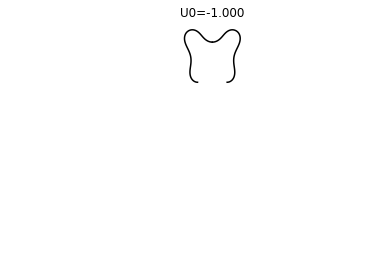

In [14]:
def update(i, contoursdata, contours, U0_list, title):
    x, z = contoursdata[i]
    contours[0][0].set_data([x, z])
    contours[1][0].set_data([-x, z])
    title.set_text('U0={0:.3f}'.format(U0_list[i]))
    return contours, title 

U0_list = np.linspace(-1, 1, 501)

fig = plt.figure()
x, z = contoursdata[0]
contours = [plt.plot(x, z, 'k-'), plt.plot(-x, z, 'k-')]
title = plt.title('U0={0:.3f}'.format(U0_list[0]))

# Setting the axes properties
plt.axis('equal')
plt.xlim([-4, 4])
plt.ylim([-20, 2])
plt.axis('off')


# Creating the Animation object
ani = animation.FuncAnimation(fig, update, 501, fargs=(contoursdata, contours, U0_list, title),
                                       interval=50, blit=False)


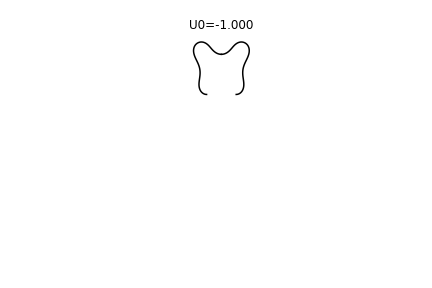
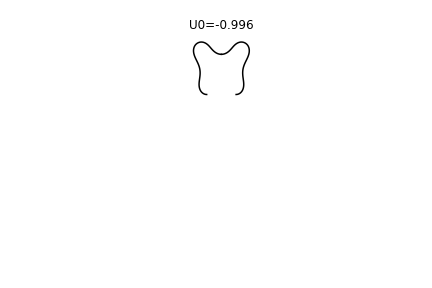
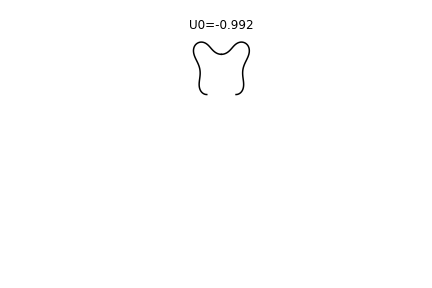
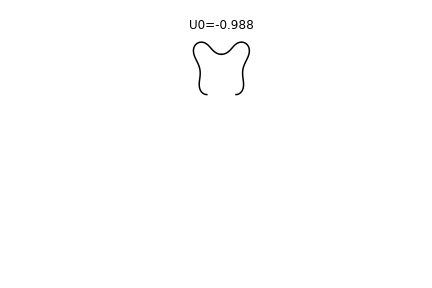
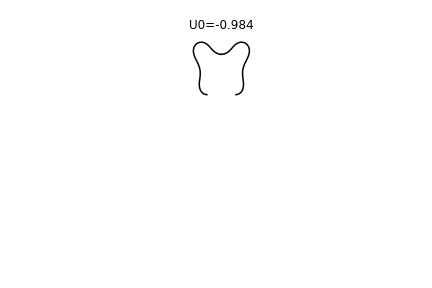
...
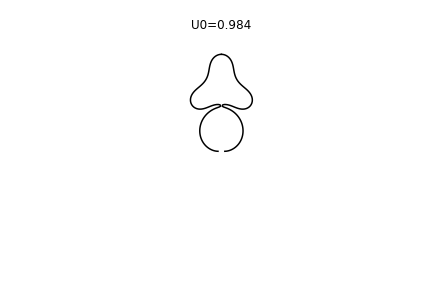
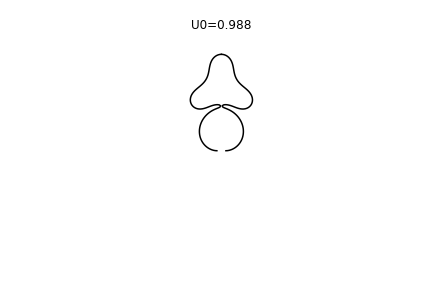
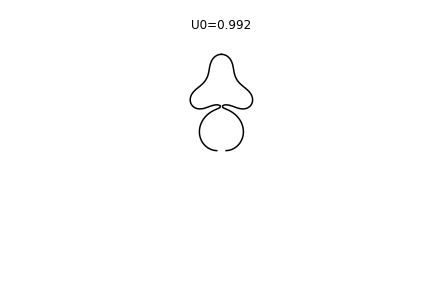
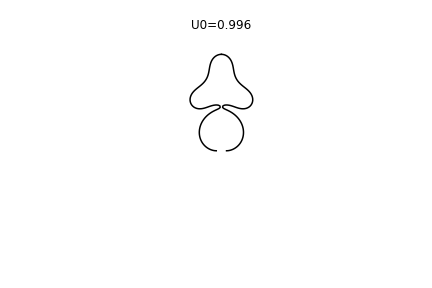
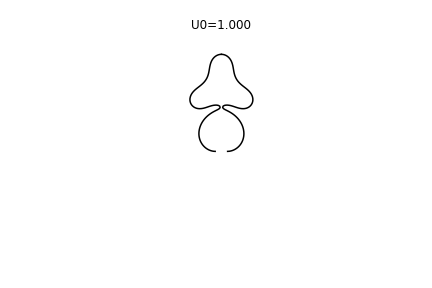

In [15]:
ani

In [16]:
ani.save('contours.mp4')

### Look for solutions with shooting methods 

In [43]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.
U0_list = np.linspace(-0.56, -0.55, 6)

sols = []
for U0 in U0_list:

    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    print(U0, sol.t_events)  
    sols.append(sol)

-0.56 [array([9.48727865]), array([18.35327533]), array([], dtype=float64)]
-0.558 [array([9.53337632]), array([18.35852055]), array([], dtype=float64)]
-0.556 [array([18.37068728]), array([28.00168893]), array([], dtype=float64)]
-0.554 [array([18.37218001]), array([27.98253486]), array([], dtype=float64)]
-0.552 [array([18.38490282]), array([27.98146541]), array([], dtype=float64)]
-0.55 [array([18.39390515]), array([27.99792332]), array([], dtype=float64)]


<IPython.core.display.Javascript object>


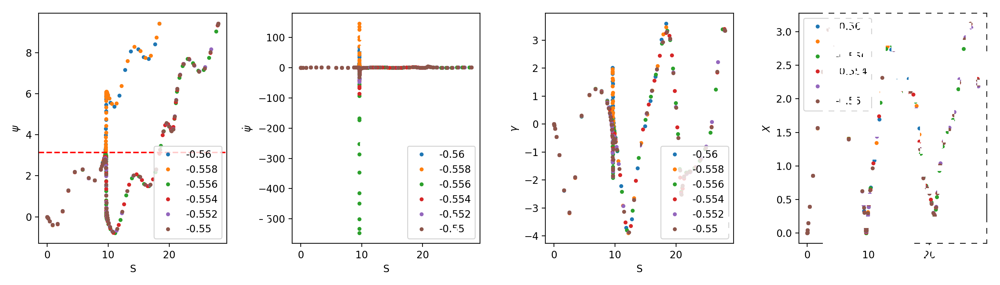

In [45]:
plot_solution(sols, U0_list)
plt.savefig('search.png', dpi=300)

In [46]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 10.

U0_1 = -0.558
U0_2 = -0.556

while U0_2 - U0_1 > 1e-13:
    
    U0 = (U0_1 + U0_2)/2
    
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1),y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    
    # Criteria: 
    if len(sol.t_events[0]) > 0:
        U0_1 = U0
    else: 
        U0_2 = U0

In [47]:
U0

-0.5563992017504642

In [63]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.

U0 = -0.556399201750464

sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 

<IPython.core.display.Javascript object>


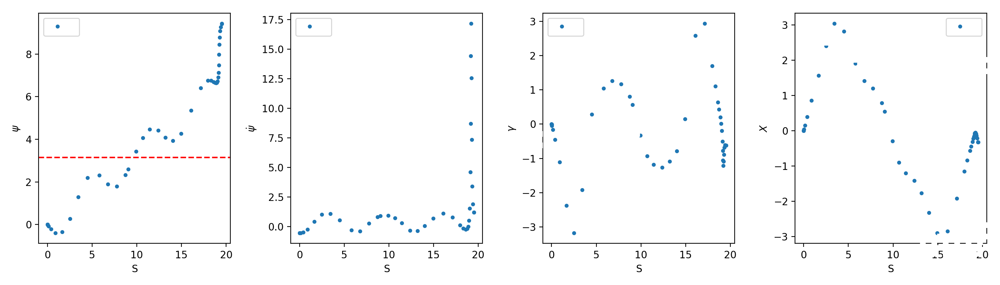

In [64]:
plot_solution([sol], [None])
plt.savefig('correct_solution.png', dpi=300)

<IPython.core.display.Javascript object>


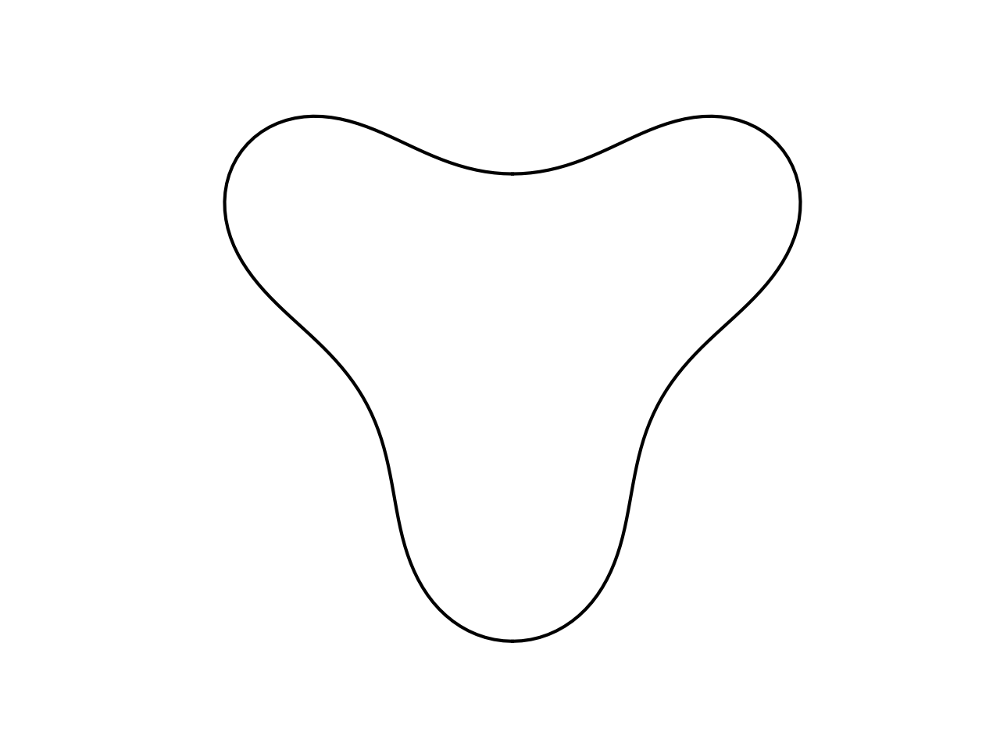

In [65]:
plt.figure()
plot_contour(generate_contour(sol))
plt.savefig('correct_shape.png', dpi=300)

In [49]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.
U0_list = np.linspace(-0.472, -0.468, 6)

sols = []
for U0 in U0_list:

    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    print(U0, sol.t_events)  
    sols.append(sol)

-0.472 [array([19.17917928]), array([27.98274586]), array([], dtype=float64)]
-0.4712 [array([28.08987785]), array([37.73015816]), array([], dtype=float64)]
-0.4704 [array([28.14642277]), array([37.86939319]), array([], dtype=float64)]
-0.4696 [array([28.17486969]), array([38.02973433]), array([], dtype=float64)]
-0.4688 [array([28.2306258]), array([], dtype=float64), array([], dtype=float64)]
-0.468 [array([28.2445208]), array([], dtype=float64), array([], dtype=float64)]


<IPython.core.display.Javascript object>


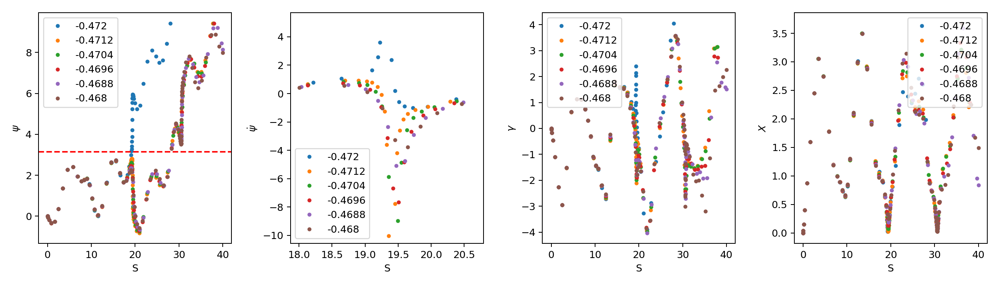

In [50]:
plot_solution(sols, U0_list)

In [62]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 20.

U0_1 = -0.472
U0_2 = -0.468

while abs(U0_2 - U0_1) > 1e-13:
    
    U0 = (U0_1 + U0_2)/2
    
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1),y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    
    # Criteria: 
    if len(sol.t_events[0]) > 0:
        U0_1 = U0
    else: 
        U0_2 = U0

In [63]:
U0

-0.47173490887769737

<IPython.core.display.Javascript object>


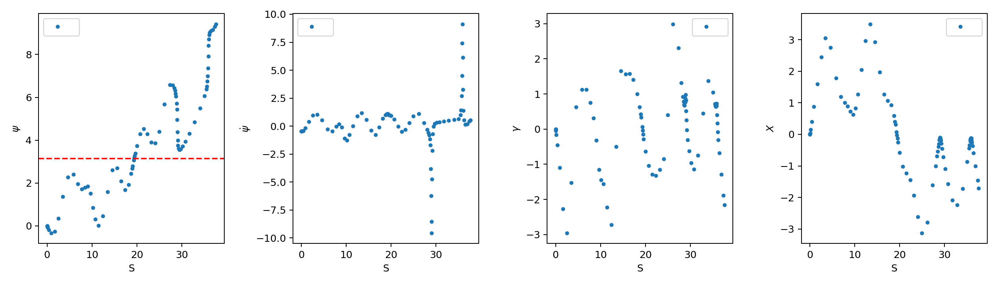

In [64]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.

sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 

plot_solution([sol], [None])

<IPython.core.display.Javascript object>


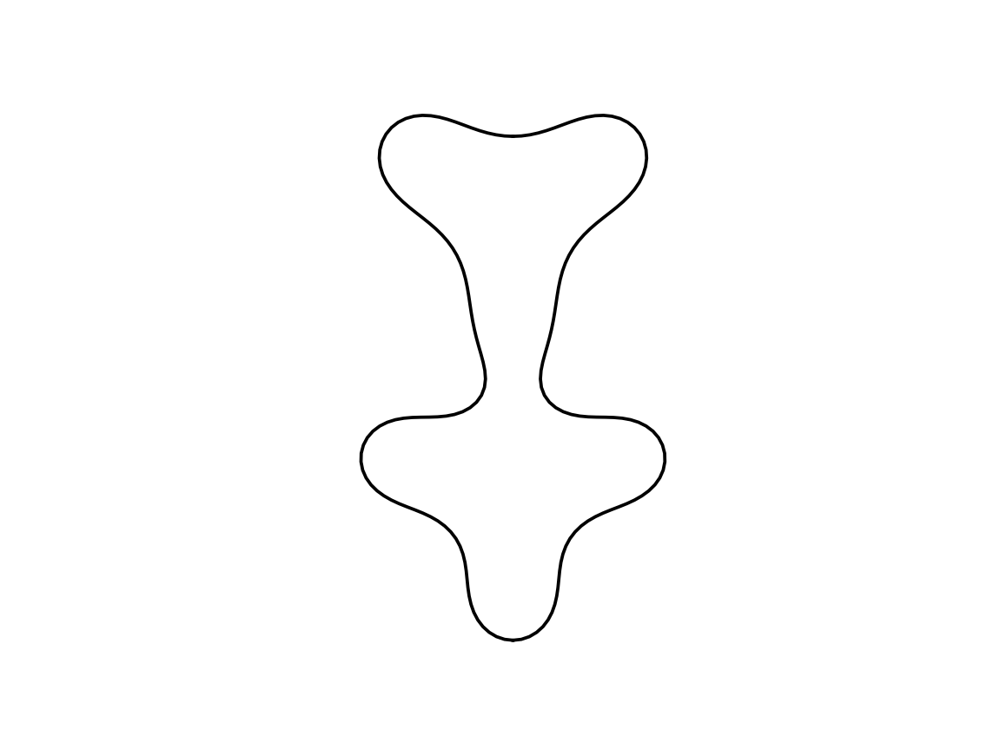

In [65]:
plt.figure()
plot_contour(generate_contour(sol))

-0.228 [array([13.15280432]), array([21.05788961]), array([], dtype=float64)]
-0.2272 [array([13.15479018]), array([21.04101588]), array([], dtype=float64)]
-0.22640000000000002 [array([13.15717479]), array([21.01143465]), array([], dtype=float64)]
-0.2256 [array([13.16005197]), array([20.99469676]), array([], dtype=float64)]
-0.2248 [array([13.163494]), array([20.972302]), array([], dtype=float64)]
-0.224 [array([13.16693351, 14.72603057, 20.95978902]), array([], dtype=float64), array([], dtype=float64)]


<IPython.core.display.Javascript object>


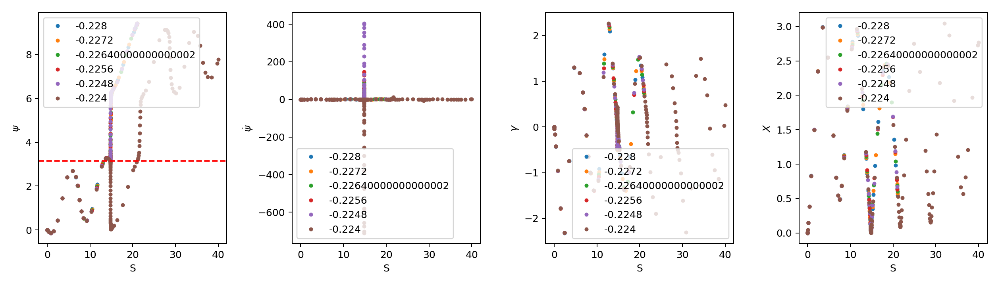

In [86]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.
U0_list = np.linspace(-0.228, -0.224, 6)

sols = []
for U0 in U0_list:

    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    print(U0, sol.t_events)  
    sols.append(sol)
plot_solution(sols, U0_list)

In [89]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 20

U0_1 = -0.224
U0_2 = -0.228

while abs(U0_2 - U0_1) > 1e-13:
    
    U0 = (U0_1 + U0_2)/2
    
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1),y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    
    # Criteria: 
    if len(sol.t_events[0]) > 1:
        U0_1 = U0
    else: 
        U0_2 = U0
U0

-0.22431549836817427

<IPython.core.display.Javascript object>


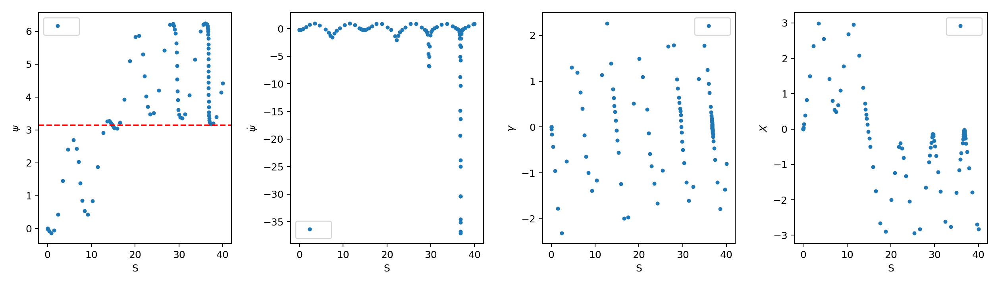

In [90]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.

sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 

plot_solution([sol], [None])

<IPython.core.display.Javascript object>


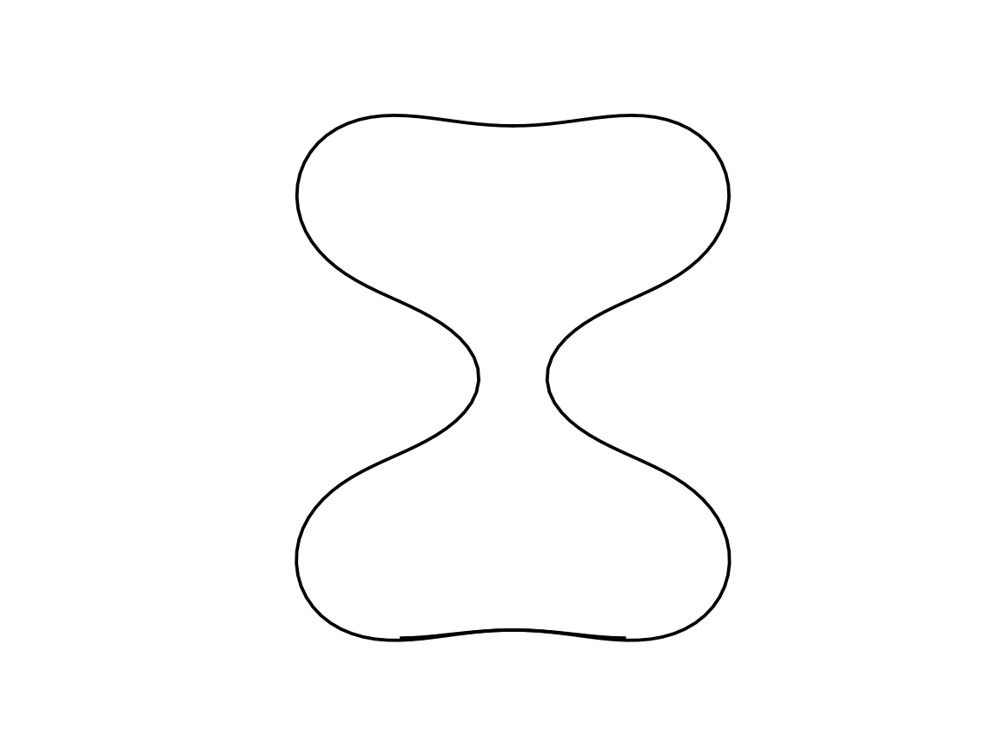

In [91]:
plt.figure()
plot_contour(generate_contour(sol))

0.064 [array([27.4616825]), array([35.28860181]), array([], dtype=float64)]
0.06520000000000001 [array([27.43794733]), array([35.28224283]), array([], dtype=float64)]
0.0664 [array([27.3141118]), array([], dtype=float64), array([], dtype=float64)]
0.06760000000000001 [array([27.3755912]), array([35.35986457]), array([], dtype=float64)]
0.0688 [array([6.86338567]), array([27.33440592]), array([], dtype=float64)]
0.07 [array([6.7916828]), array([27.33149354]), array([], dtype=float64)]


<IPython.core.display.Javascript object>


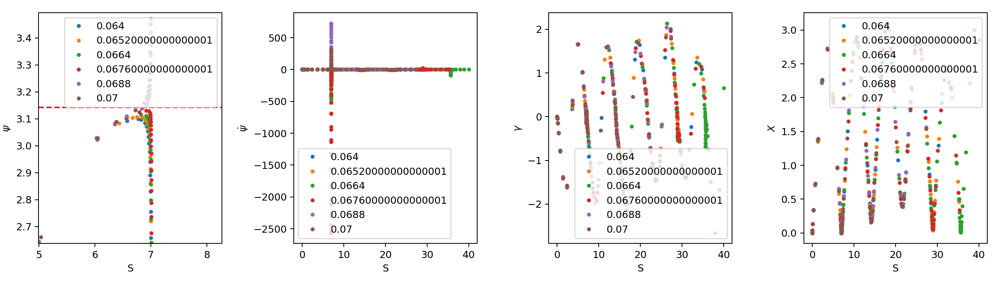

In [93]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.
U0_list = np.linspace(0.064, 0.07, 6)

sols = []
for U0 in U0_list:

    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    print(U0, sol.t_events)  
    sols.append(sol)
plot_solution(sols, U0_list)

In [66]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 10

U0_1 = 0.07
U0_2 = 0.064

while abs(U0_2 - U0_1) > 1e-13:
    
    U0 = (U0_1 + U0_2)/2
    
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1),y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    
    # Criteria: 
    if len(sol.t_events[0]) > 0:
        U0_1 = U0
    else: 
        U0_2 = U0
U0

0.06786476396481159

<IPython.core.display.Javascript object>


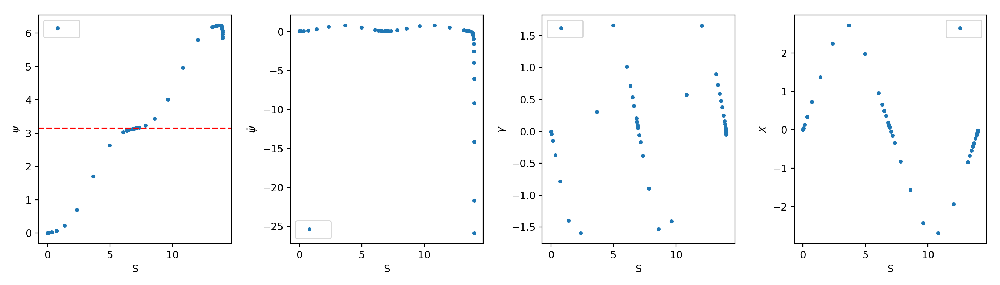

In [72]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 14.
U0 = 0.067864763964811

sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 

plot_solution([sol], [None])
plt.savefig('Pb=1.Sb=-1.1.C0=0.sol1.png', dpi=300)

<IPython.core.display.Javascript object>


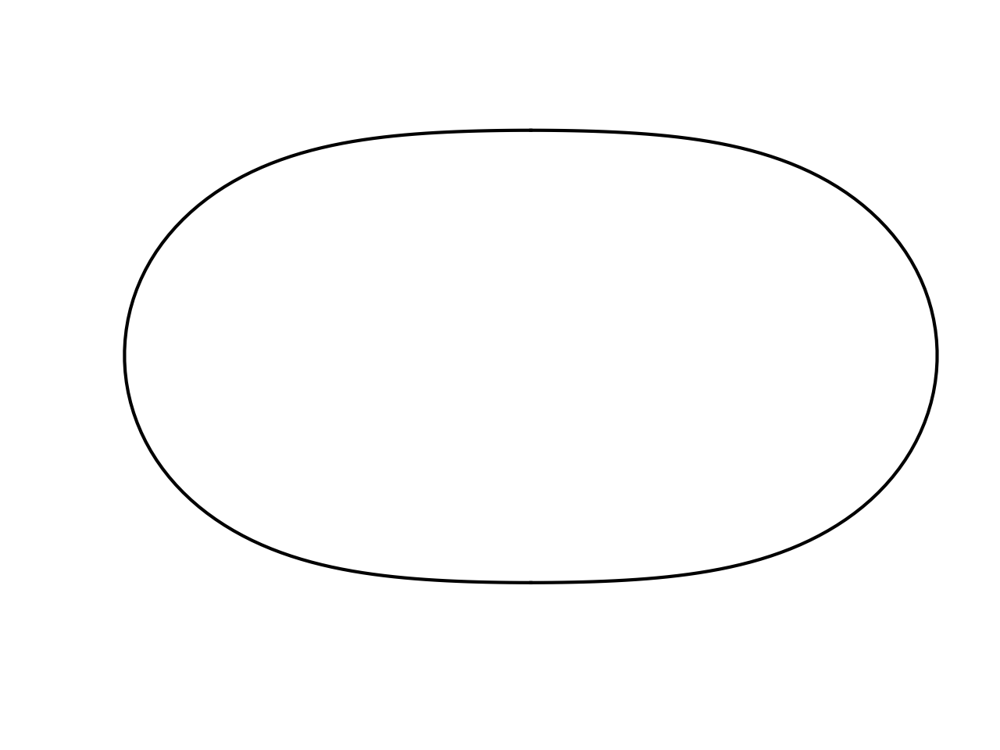

In [73]:
plt.figure()
plot_contour(generate_contour(sol))
plt.tight_layout()
plt.savefig('Pb=1.Sb=-1.1.C0=0.shape1.png', dpi=300)

0.07 [array([6.7916828]), array([27.33149354]), array([], dtype=float64)]
0.0704 [array([6.77260364]), array([27.33457269]), array([], dtype=float64)]
0.0708 [array([6.75675228]), array([27.30791557]), array([], dtype=float64)]
0.0712 [array([6.74032257]), array([27.30961381]), array([], dtype=float64)]
0.0716 [array([27.39994201]), array([35.39390311]), array([], dtype=float64)]
0.072 [array([27.40447484]), array([35.33861654]), array([], dtype=float64)]


<IPython.core.display.Javascript object>


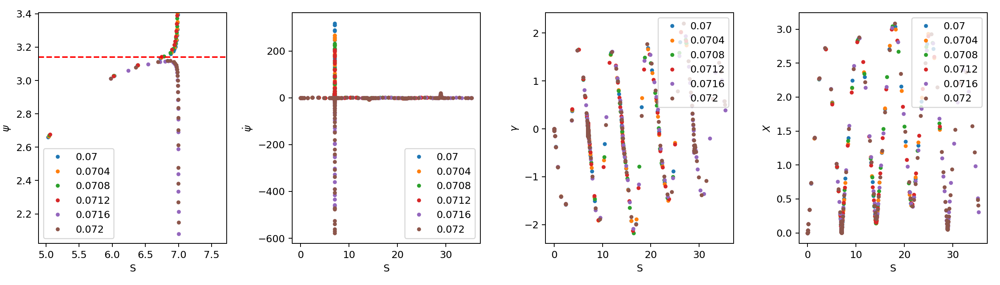

In [101]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.
U0_list = np.linspace(0.07, 0.072, 6)

sols = []
for U0 in U0_list:

    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    print(U0, sol.t_events)  
    sols.append(sol)
plot_solution(sols, U0_list)

In [119]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 8

U0_1 = 0.07
U0_2 = 0.072

while abs(U0_2 - U0_1) > 1e-13:
    
    U0 = (U0_1 + U0_2)/2
    
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1),y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    
    # Criteria: 
    if len(sol.t_events[0]) > 0:
        U0_1 = U0
    else: 
        U0_2 = U0
U0

0.07152039954991776

<IPython.core.display.Javascript object>


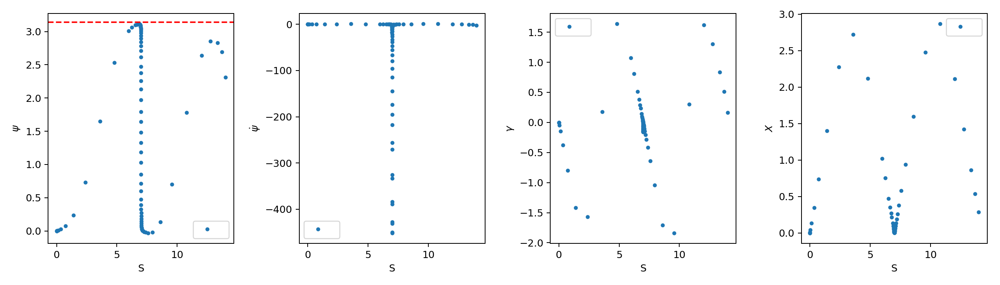

In [120]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 14.

sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 

plot_solution([sol], [None])

<IPython.core.display.Javascript object>


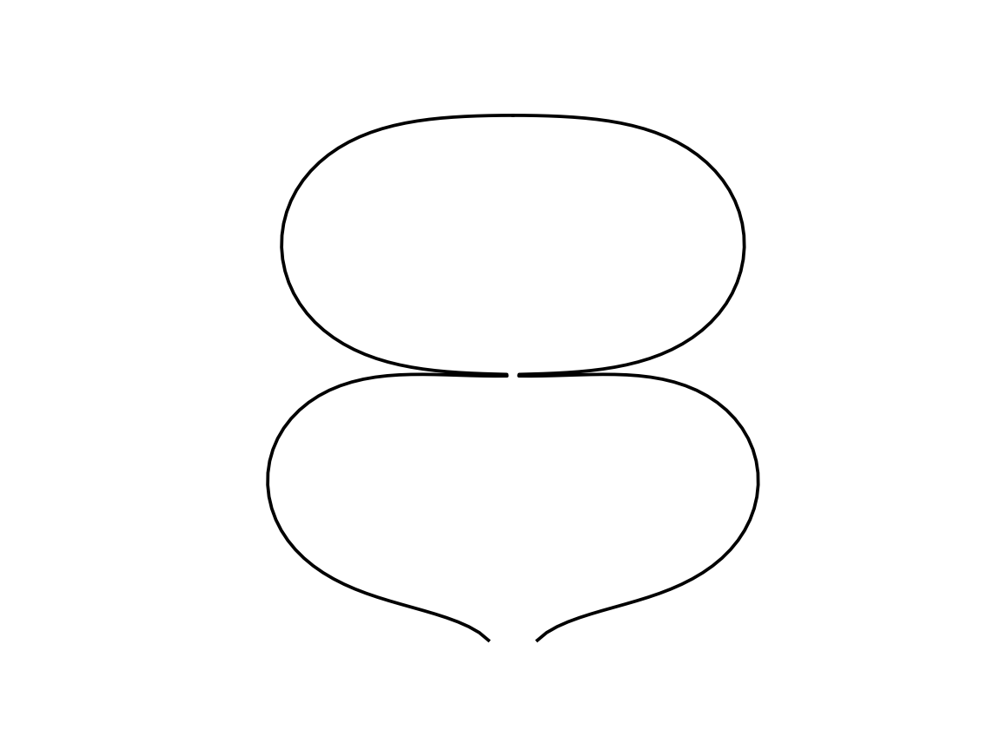

In [121]:
plt.figure()
plot_contour(generate_contour(sol))

0.452 [array([6.84754635]), array([21.86908928]), array([], dtype=float64)]
0.45280000000000004 [array([6.8622295]), array([21.98986968]), array([], dtype=float64)]
0.4536 [array([6.88181289]), array([30.06410599]), array([], dtype=float64)]
0.4544 [array([30.66132394]), array([], dtype=float64), array([], dtype=float64)]
0.4552 [array([31.13430508]), array([], dtype=float64), array([], dtype=float64)]
0.456 [array([31.49803467]), array([], dtype=float64), array([], dtype=float64)]


<IPython.core.display.Javascript object>


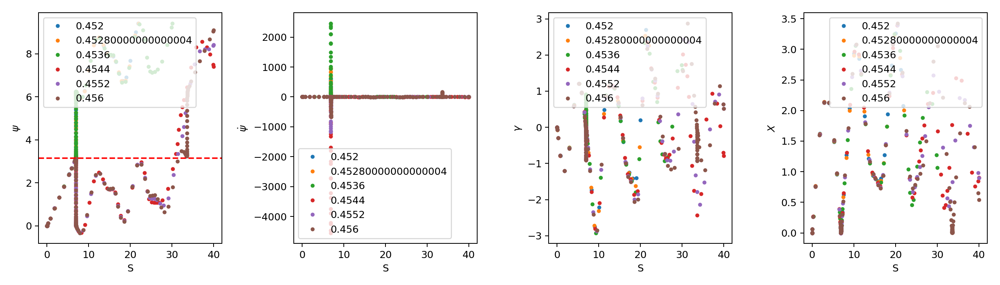

In [122]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.
U0_list = np.linspace(0.452, 0.456, 6)

sols = []
for U0 in U0_list:

    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    print(U0, sol.t_events)  
    sols.append(sol)
plot_solution(sols, U0_list)

In [75]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 10

U0_1 = 0.45
U0_2 = 0.46

while abs(U0_2 - U0_1) > 1e-13:
    
    U0 = (U0_1 + U0_2)/2
    
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1),y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    
    # Criteria: 
    if len(sol.t_events[0]) > 0:
        U0_1 = U0
    else: 
        U0_2 = U0
U0

0.4541615196686325

<IPython.core.display.Javascript object>


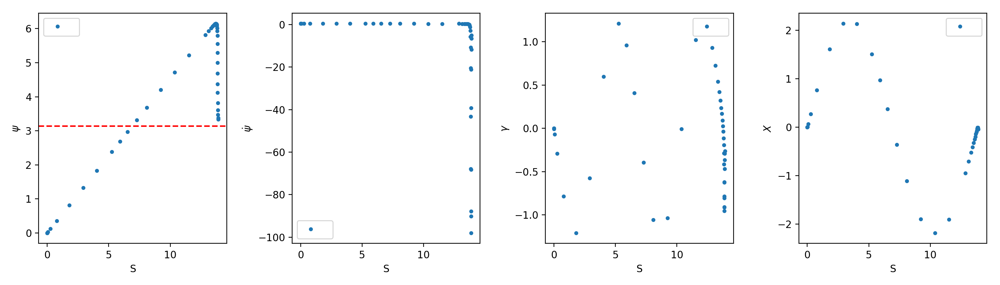

In [85]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 13.9
U0 = 0.4541

sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 

plot_solution([sol], [None])
plt.savefig('Pb=1.Sb=-1.1.C0=0.sol2.png', dpi=300)

<IPython.core.display.Javascript object>


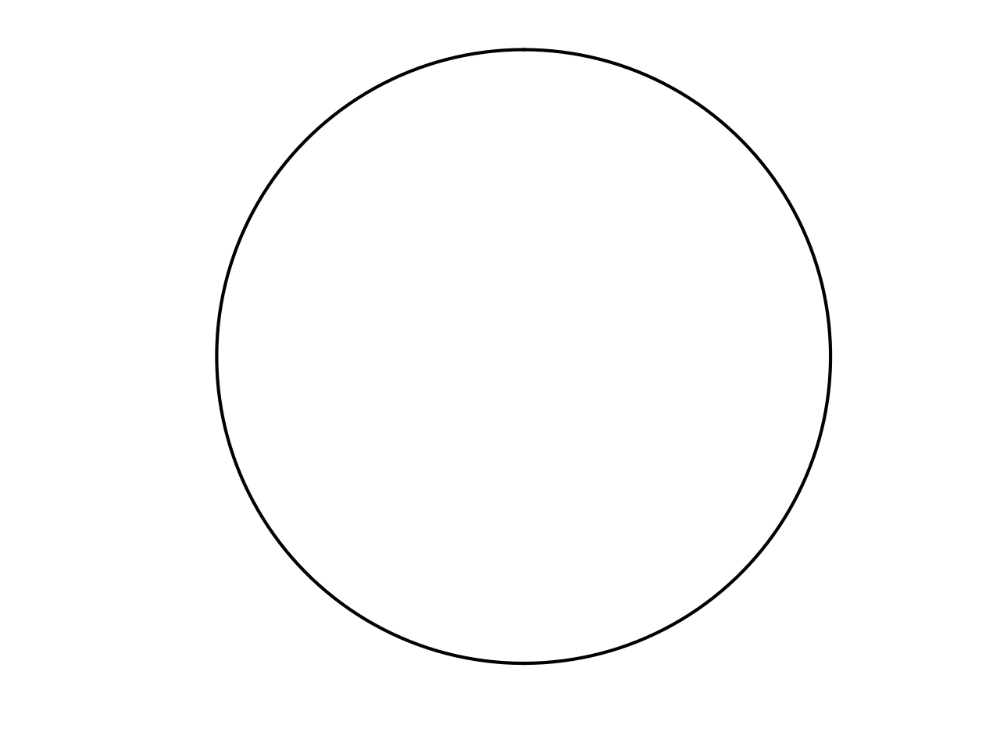

In [86]:
plt.figure()
plot_contour(generate_contour(sol))
plt.tight_layout()
plt.savefig('Pb=1.Sb=-1.1.C0=0.shape2.png', dpi=300)

0.6 [array([16.66456572]), array([25.75179103]), array([], dtype=float64)]
0.6008 [array([7.45751504]), array([16.6450612]), array([], dtype=float64)]
0.6016 [array([7.43932514]), array([16.67304257]), array([], dtype=float64)]
0.6023999999999999 [array([7.42693274]), array([16.67363335]), array([], dtype=float64)]
0.6032 [array([7.41707217]), array([16.71647517]), array([], dtype=float64)]
0.604 [array([7.40899372]), array([16.66637164]), array([], dtype=float64)]


<IPython.core.display.Javascript object>


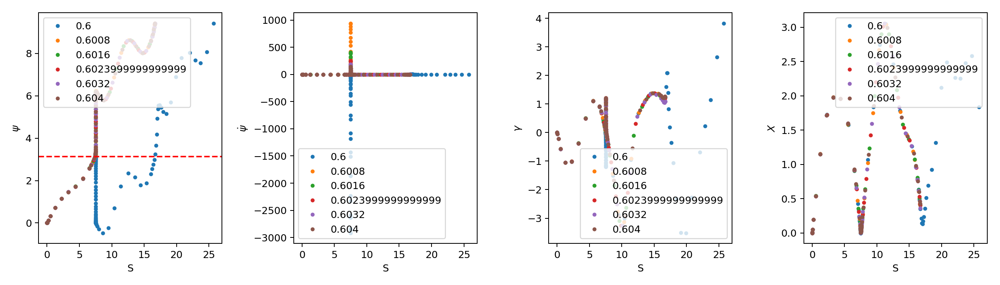

In [135]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.
U0_list = np.linspace(0.6, 0.604, 6)

sols = []
for U0 in U0_list:

    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    print(U0, sol.t_events)  
    sols.append(sol)
plot_solution(sols, U0_list)

In [87]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 10

U0_1 = 0.61
U0_2 = 0.6

while abs(U0_2 - U0_1) > 1e-13:
    
    U0 = (U0_1 + U0_2)/2
    
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1),y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    
    # Criteria: 
    if len(sol.t_events[0]) > 0:
        U0_1 = U0
    else: 
        U0_2 = U0
U0

0.6001853059954738

<IPython.core.display.Javascript object>


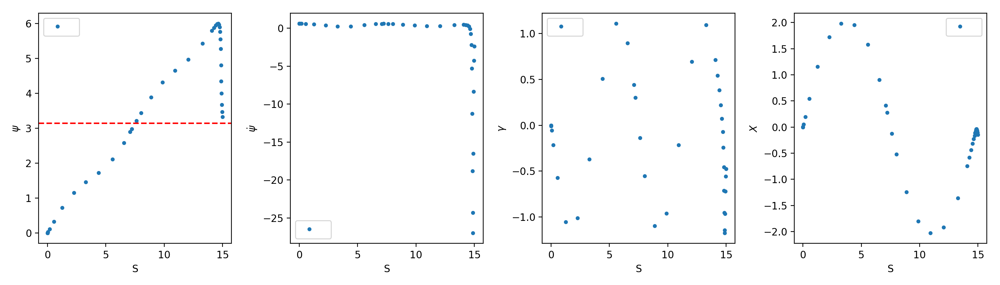

In [92]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 15.
U0 = 0.600185305995473

sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 

plot_solution([sol], [None])
plt.savefig('Pb=1.Sb=-1.1.C0=0.sol3.png', dpi=300)

<IPython.core.display.Javascript object>


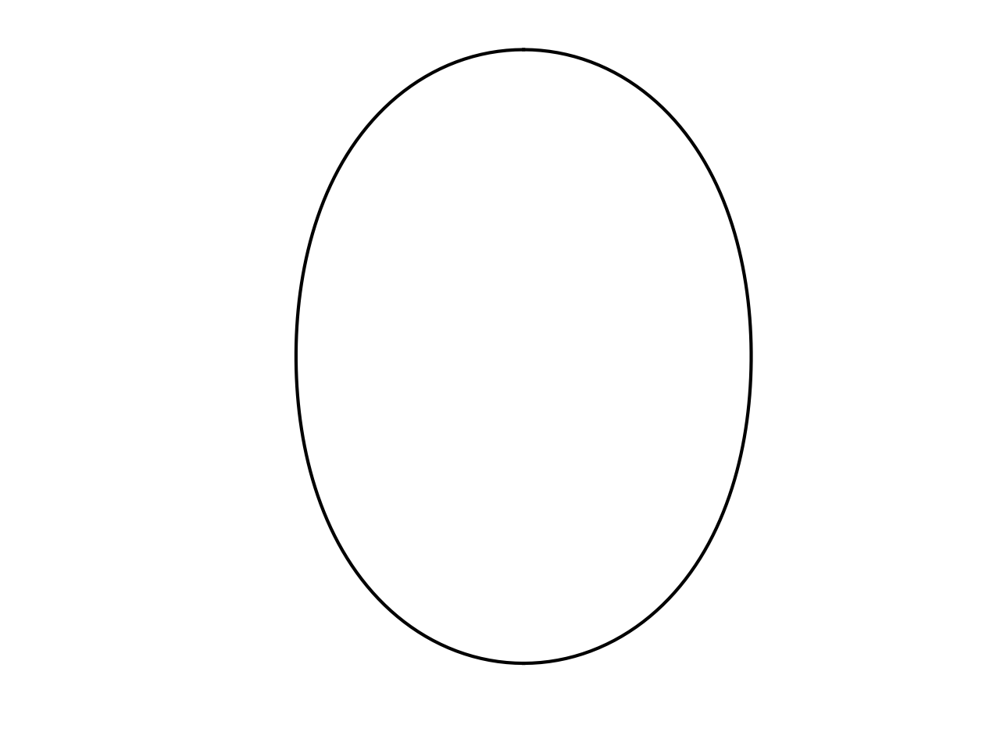

In [93]:
plt.figure()
plot_contour(generate_contour(sol))
plt.tight_layout()
plt.savefig('Pb=1.Sb=-1.1.C0=0.shape3.png', dpi=300)

0.968 [array([7.39492093]), array([26.03037112]), array([], dtype=float64)]
0.9688 [array([7.39564596]), array([25.96768678]), array([], dtype=float64)]
0.9696 [array([ 7.39637738,  9.54362152, 26.03032786]), array([35.16521113]), array([], dtype=float64)]
0.9703999999999999 [array([ 7.39711525,  9.51053852, 25.95487873]), array([35.05421068]), array([], dtype=float64)]
0.9712 [array([ 7.39785963,  9.4852552 , 25.96987692]), array([35.08590164]), array([], dtype=float64)]
0.972 [array([ 7.39861052,  9.46393341, 25.95012952]), array([35.02335244]), array([], dtype=float64)]


/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


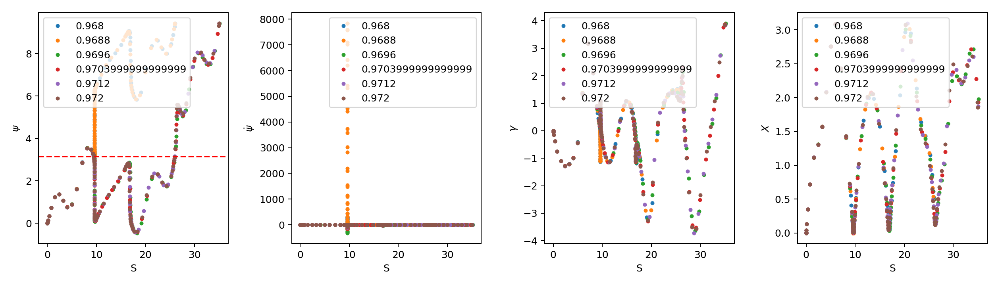

In [146]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.
U0_list = np.linspace(0.968, 0.972, 6)

sols = []
for U0 in U0_list:

    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    print(U0, sol.t_events)  
    sols.append(sol)
plot_solution(sols, U0_list)

In [94]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 10

U0_1 = 0.97
U0_2 = 0.968

while abs(U0_2 - U0_1) > 1e-13:
    
    U0 = (U0_1 + U0_2)/2
    
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1),y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    
    # Criteria: 
    if len(sol.t_events[0]) > 1:
        U0_1 = U0
    else: 
        U0_2 = U0
U0

0.9688285481506609

<IPython.core.display.Javascript object>


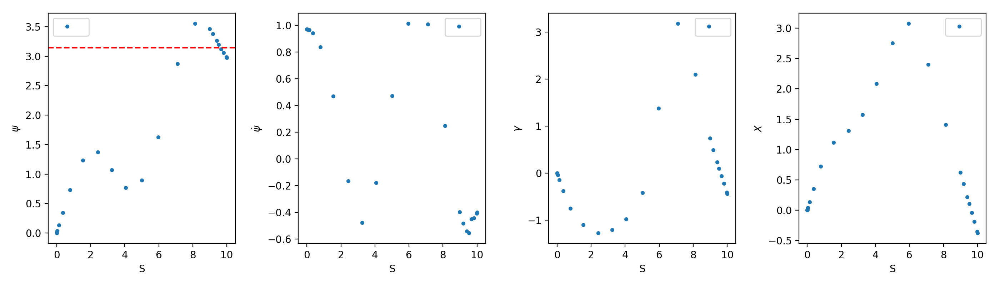

In [118]:
Sb = -1.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 10.
U0 = 0.9688285481506609

sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 

plot_solution([sol], [None])
# plt.savefig('Pb=1.Sb=-1.1.C0=0.sol4.png', dpi=300)

<IPython.core.display.Javascript object>


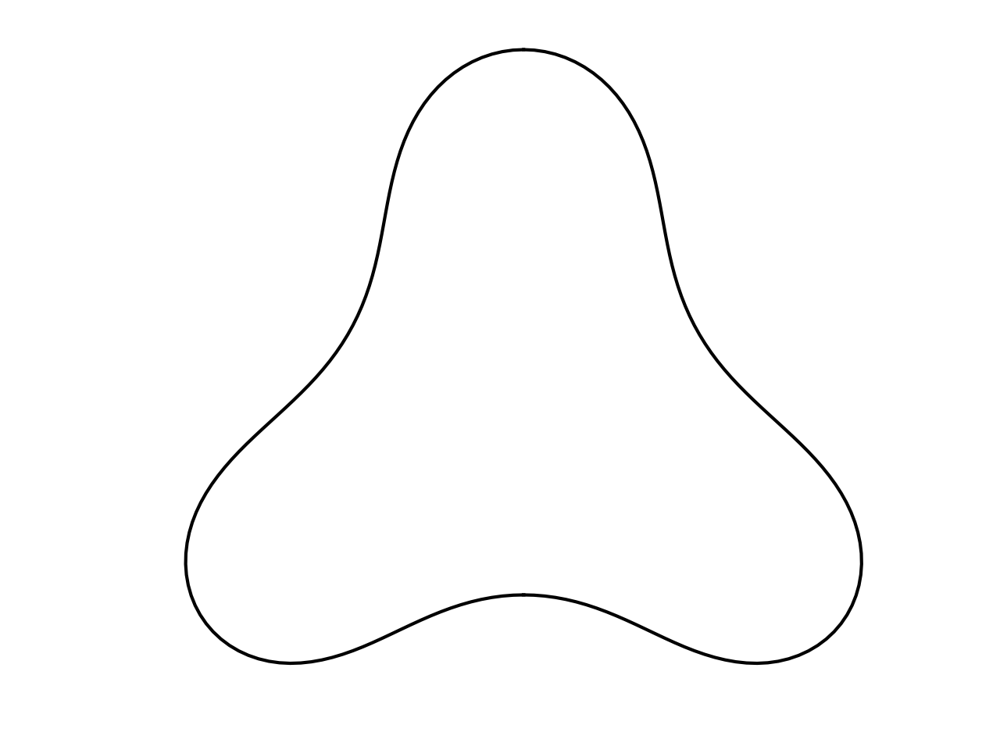

In [119]:
plt.figure()
plot_contour(generate_contour(sol))
plt.tight_layout()
plt.savefig('Pb=1.Sb=-1.1.C0=0.shape4.png', dpi=300)

In [21]:
Sb = 0.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 100
U0_list = np.linspace(-6, -2, 501)

sols = []
for U0 in U0_list:
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi])
    sols.append(sol)

(389,) (389,) (389, 4)
(165,) (165,) (165, 4)
(165,) (165,) (165, 4)


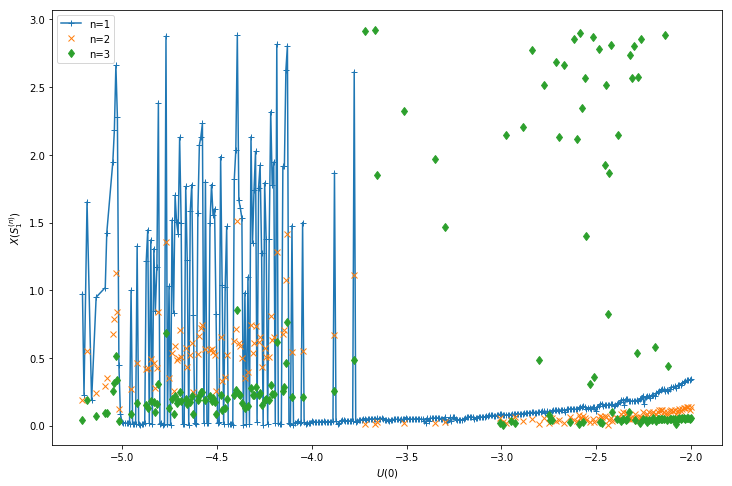

In [22]:
U0_n_geq1 = np.array([U0 for sol, U0 in zip(sols, U0_list) if len(sol.t_events[0]) > 0])
U0_n_geq2 = np.array([U0 for sol, U0 in zip(sols, U0_list) if len(sol.t_events[0]) > 1]) 
U0_n_geq3 = np.array([U0 for sol, U0 in zip(sols, U0_list) if len(sol.t_events[0]) > 2]) 

S1_n_geq1 = np.array([sol.t_events[0] for sol in sols if len(sol.t_events[0]) > 0])
S1_n_geq2 = np.array([sol.t_events[0] for sol in sols if len(sol.t_events[0]) > 1])
S1_n_geq3 = np.array([sol.t_events[0] for sol in sols if len(sol.t_events[0]) > 2])

y_n_geq1 = np.array([sol.sol(sol.t_events[0])[:, 0] for sol in sols if len(sol.t_events[0]) > 0])
y_n_geq2 = np.array([sol.sol(sol.t_events[0])[:, 1] for sol in sols if len(sol.t_events[0]) > 1])
y_n_geq3 = np.array([sol.sol(sol.t_events[0])[:, 2] for sol in sols if len(sol.t_events[0]) > 2])

print(U0_n_geq1.shape, S1_n_geq1.shape, y_n_geq1.shape)
print(U0_n_geq2.shape, S1_n_geq2.shape, y_n_geq2.shape)
print(U0_n_geq3.shape, S1_n_geq3.shape, y_n_geq3.shape)


plt.figure(figsize=(12, 8))
plt.plot(U0_n_geq1, y_n_geq1[:, 3], '+-', label='n=1')
plt.plot(U0_n_geq2, y_n_geq2[:, 3], 'x', label='n=2')
plt.plot(U0_n_geq3, y_n_geq3[:, 3], 'd', label='n=3')
plt.xlabel(r'$U(0)$')
plt.ylabel(r'$X(S_1^{(n)})$')
plt.legend()
plt.show()

-4.6 [array([ 8.12993204, 10.12530781, 11.0437558 , 11.40404684, 11.53885945,
       11.58988374, 11.60945395, 11.616773  , 11.61951984, 11.62058806,
       11.62099422, 11.62115188, 11.62121153, 11.62123423, 11.62124298,
       11.62124643, 11.62124775, 11.62124826, 11.62124846, 11.62124854,
       11.62124857, 11.62124858, 11.62124858, 11.62124859, 11.62124859,
       11.62124859, 11.62124859, 11.62124859, 11.62124859, 11.62124859,
       11.62124859, 11.62124859, 11.62124859]), array([], dtype=float64), array([], dtype=float64)]
-4.56 [array([ 8.09325081, 10.23512009, 11.26728616, 11.64528901, 11.78853947,
       11.84142282, 11.86149219, 11.86899799, 11.87186699, 11.87293356,
       11.87333544, 11.87349063, 11.87355068, 11.87357327, 11.87358183,
       11.87358507, 11.87358632, 11.8735868 , 11.87358698, 11.87358705,
       11.87358708, 11.87358709, 11.87358709, 11.8735871 , 11.8735871 ,
       11.8735871 , 11.8735871 , 11.8735871 , 11.8735871 , 11.8735871 ,
       11.8735871 , 11.

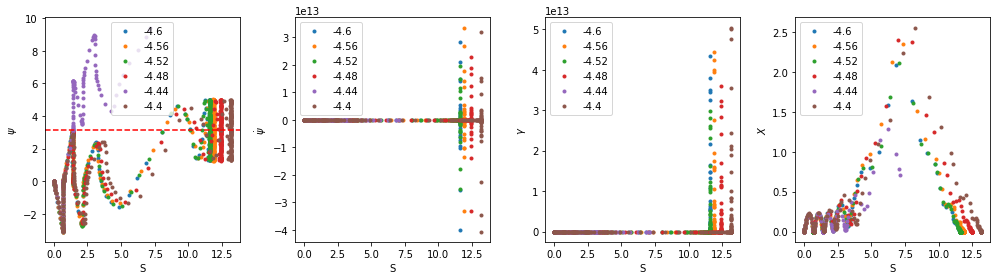

In [24]:
Sb = 0.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.
U0_list = np.linspace(-4.6, -4.4, 6)

sols = []
for U0 in U0_list:

    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    print(U0, sol.t_events)  
    sols.append(sol)
plot_solution(sols, U0_list)

In [187]:
Sb = 0.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 2.5

U0_1 = -4.6
U0_2 = -4.44

while abs(U0_2 - U0_1) > 1e-13:
    
    U0 = (U0_1 + U0_2)/2
    
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1),y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    
    # Criteria: 
    if len(sol.t_events[0]) > 0:
        U0_1 = U0
    else: 
        U0_2 = U0
U0

-4.593793448929572

/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


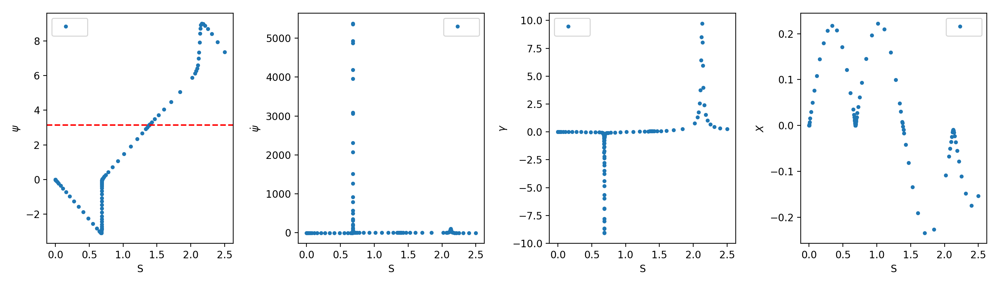

In [189]:
Sb = 0.1
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 2.5
U0 = -4.593793448929572

sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 

plot_solution([sol], [None])
plt.savefig('sol0.png', dpi=300)

/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


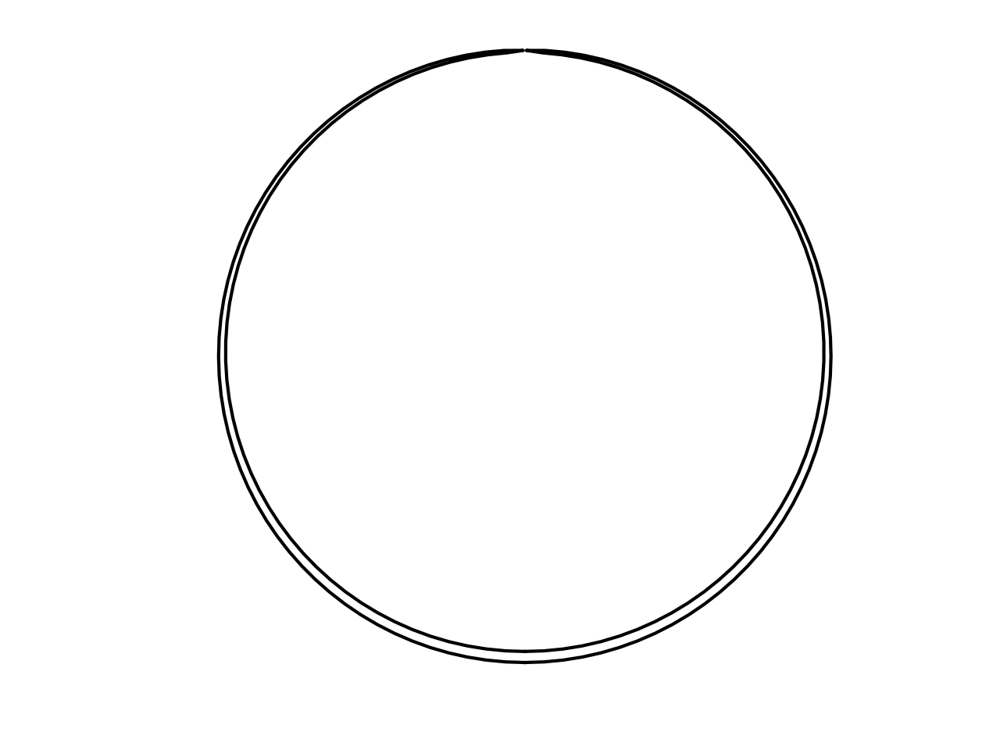

In [190]:
plt.figure()
plot_contour(generate_contour(sol))
plt.tight_layout()
plt.savefig('shape0.png', dpi=300)

(501,) (501,) (501, 4)
(241,) (241,) (241, 4)
(241,) (241,) (241, 4)


<IPython.core.display.Javascript object>


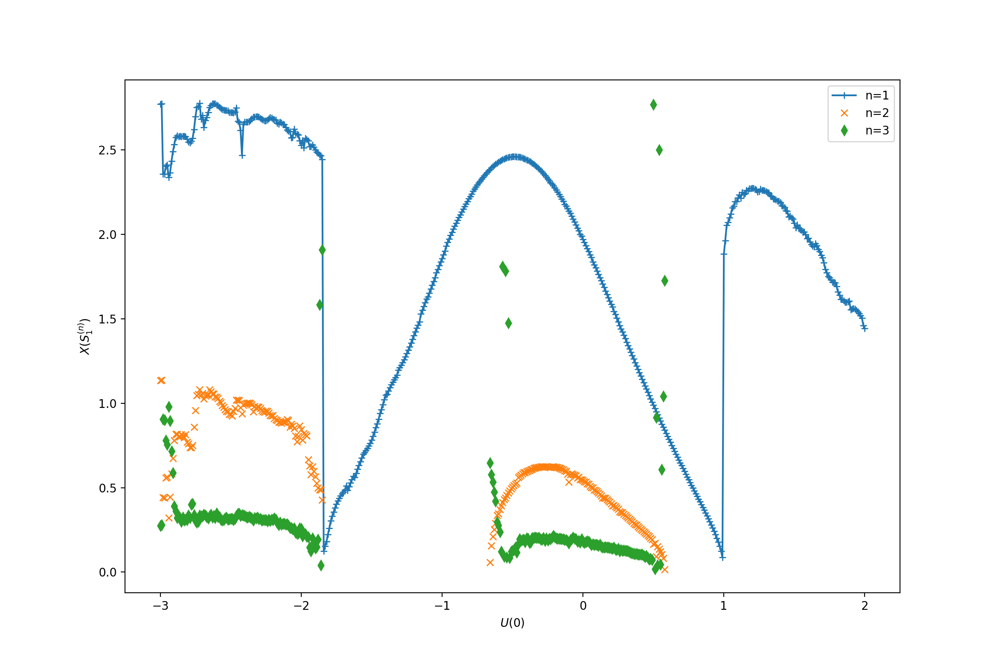

In [121]:
Sb = -0.5
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 100
U0_list = np.linspace(-3, 2, 501)

sols = []
for U0 in U0_list:
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi])
    sols.append(sol)

U0_n_geq1 = np.array([U0 for sol, U0 in zip(sols, U0_list) if len(sol.t_events[0]) > 0])
U0_n_geq2 = np.array([U0 for sol, U0 in zip(sols, U0_list) if len(sol.t_events[0]) > 1]) 
U0_n_geq3 = np.array([U0 for sol, U0 in zip(sols, U0_list) if len(sol.t_events[0]) > 2]) 

S1_n_geq1 = np.array([sol.t_events[0] for sol in sols if len(sol.t_events[0]) > 0])
S1_n_geq2 = np.array([sol.t_events[0] for sol in sols if len(sol.t_events[0]) > 1])
S1_n_geq3 = np.array([sol.t_events[0] for sol in sols if len(sol.t_events[0]) > 2])

y_n_geq1 = np.array([sol.sol(sol.t_events[0])[:, 0] for sol in sols if len(sol.t_events[0]) > 0])
y_n_geq2 = np.array([sol.sol(sol.t_events[0])[:, 1] for sol in sols if len(sol.t_events[0]) > 1])
y_n_geq3 = np.array([sol.sol(sol.t_events[0])[:, 2] for sol in sols if len(sol.t_events[0]) > 2])

print(U0_n_geq1.shape, S1_n_geq1.shape, y_n_geq1.shape)
print(U0_n_geq2.shape, S1_n_geq2.shape, y_n_geq2.shape)
print(U0_n_geq3.shape, S1_n_geq3.shape, y_n_geq3.shape)


plt.figure(figsize=(12, 8))
plt.plot(U0_n_geq1, y_n_geq1[:, 3], '+-', label='n=1')
plt.plot(U0_n_geq2, y_n_geq2[:, 3], 'x', label='n=2')
plt.plot(U0_n_geq3, y_n_geq3[:, 3], 'd', label='n=3')
plt.xlabel(r'$U(0)$')
plt.ylabel(r'$X(S_1^{(n)})$')
plt.legend()
plt.show()

-1.84 [array([5.58790409]), array([10.59323699]), array([], dtype=float64)]
-1.842 [array([5.60134883]), array([10.59103088]), array([], dtype=float64)]
-1.844 [array([5.61823357]), array([10.58451348]), array([], dtype=float64)]
-1.846 [array([5.64199315]), array([10.57345602]), array([], dtype=float64)]
-1.848 [array([10.55495011, 12.89865686, 16.18658173]), array([21.8571345]), array([], dtype=float64)]
-1.85 [array([10.54454394, 12.86631188, 21.53246964]), array([27.29910545]), array([], dtype=float64)]


<IPython.core.display.Javascript object>


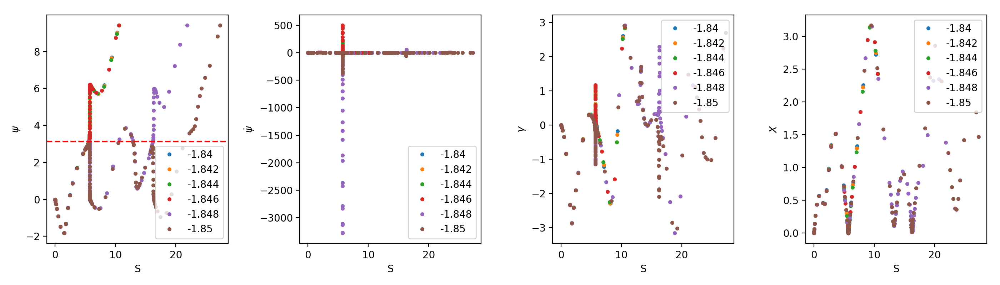

In [122]:
Sb = -0.5
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.
U0_list = np.linspace(-1.84, -1.85, 6)

sols = []
for U0 in U0_list:

    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    print(U0, sol.t_events)  
    sols.append(sol)
plot_solution(sols, U0_list)

In [175]:
Sb = -0.5
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 8

U0_1 = -1.84
U0_2 = -1.85

while abs(U0_2 - U0_1) > 1e-13:
    
    U0 = (U0_1 + U0_2)/2
    
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1),y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    
    # Criteria: 
    if len(sol.t_events[0]) > 0:
        U0_1 = U0
    else: 
        U0_2 = U0
U0

-1.8477405209981224

/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


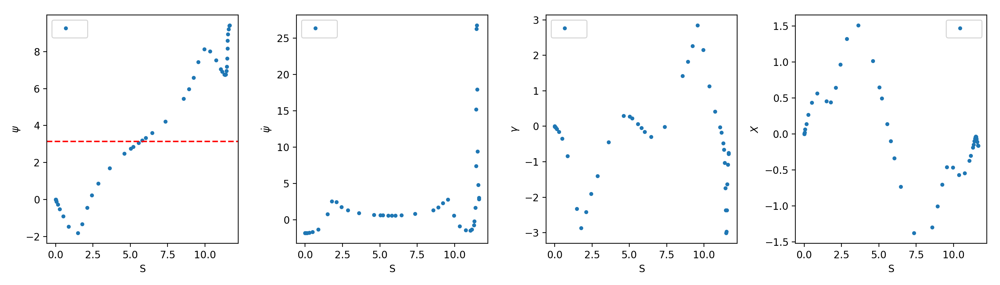

In [176]:
Sb = -0.5
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 14
U0 = -1.8477405209981224

sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 

plot_solution([sol], [None])
plt.savefig('sol0.png', dpi=300)

/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


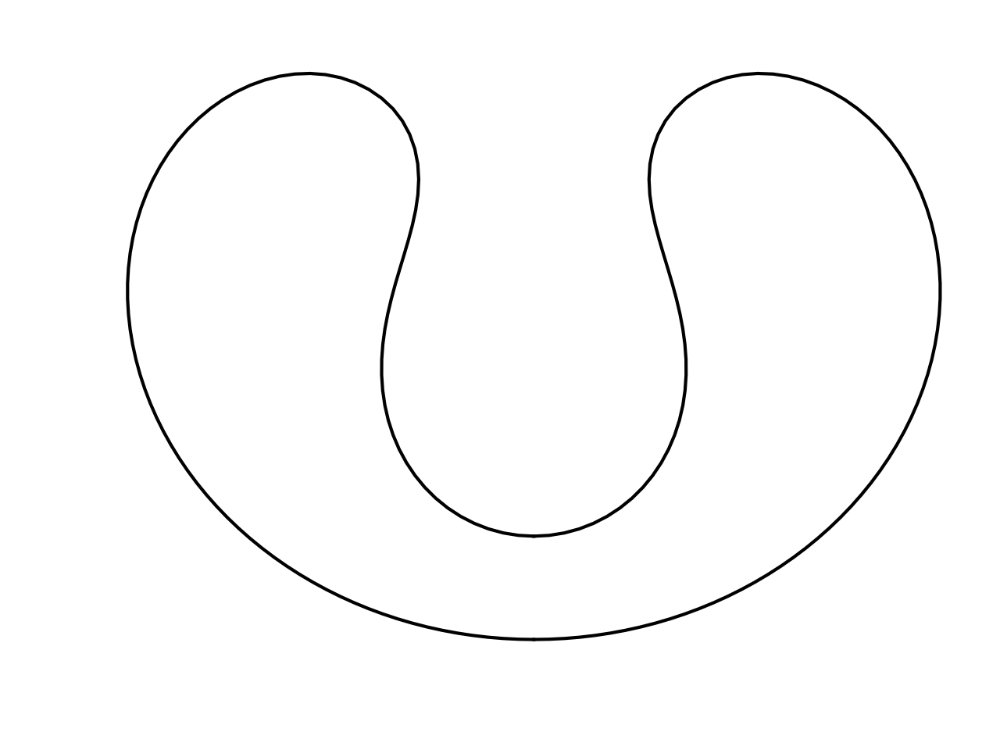

In [177]:
plt.figure()
plot_contour(generate_contour(sol))
plt.tight_layout()
plt.savefig('shape0.png', dpi=300)

0.95 [array([3.04609159]), array([8.84246638]), array([], dtype=float64)]
0.97 [array([3.05035018]), array([8.69494427]), array([], dtype=float64)]
0.99 [array([3.07471301]), array([8.60018035]), array([], dtype=float64)]
1.01 [array([8.42916254]), array([14.19789997]), array([], dtype=float64)]
1.03 [array([8.31119452]), array([14.14083262]), array([], dtype=float64)]
1.05 [array([8.23792006]), array([14.12014414]), array([], dtype=float64)]


<IPython.core.display.Javascript object>


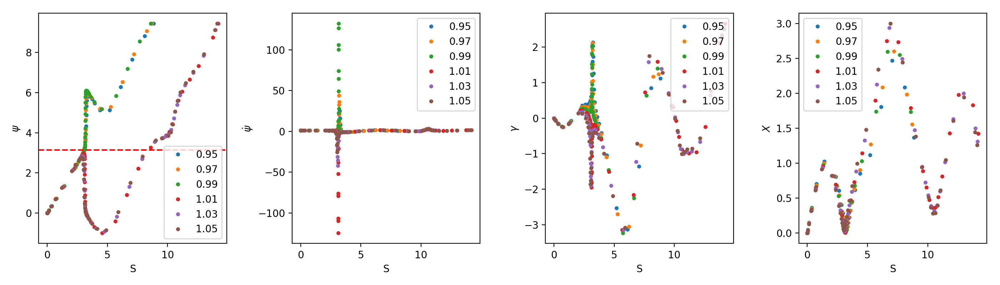

In [130]:
Sb = -0.5
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.
U0_list = np.linspace(0.95, 1.05, 6)

sols = []
for U0 in U0_list:

    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    print(U0, sol.t_events)  
    sols.append(sol)
plot_solution(sols, U0_list)

In [131]:
Sb = -0.5
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 5

U0_1 = 0.95
U0_2 = 1.05

while abs(U0_2 - U0_1) > 1e-13:
    
    U0 = (U0_1 + U0_2)/2
    
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1),y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    
    # Criteria: 
    if len(sol.t_events[0]) > 0:
        U0_1 = U0
    else: 
        U0_2 = U0
U0

0.9997786947310489

/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


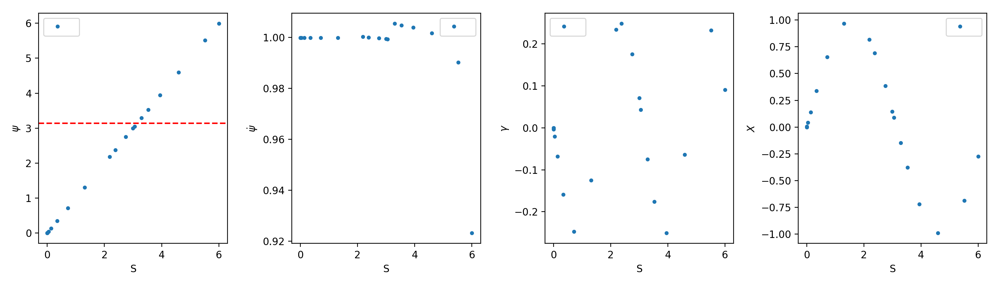

In [185]:
Sb = -0.5
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 6
U0 = 0.9997786947310489

sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 

plot_solution([sol], [None])
plt.savefig('sol3.png', dpi=300)

/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


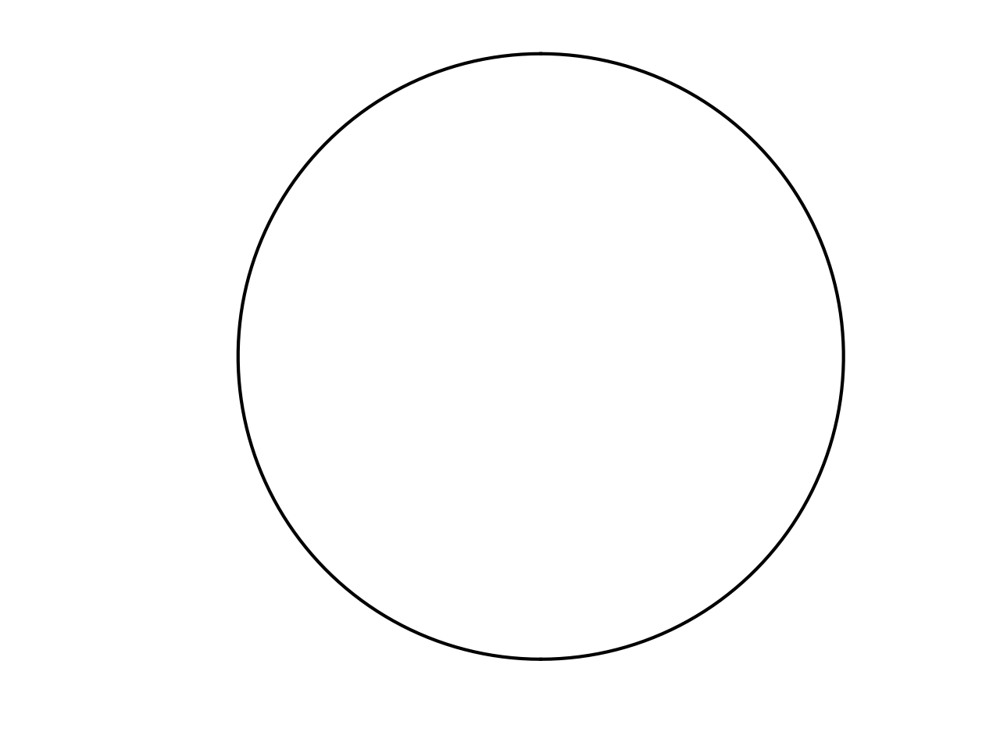

In [186]:
plt.figure()
plot_contour(generate_contour(sol))
plt.tight_layout()
plt.savefig('shape3.png', dpi=300)

-0.68 [array([4.99005734]), array([10.99407805]), array([], dtype=float64)]
-0.664 [array([4.97092826]), array([10.93040966]), array([], dtype=float64)]
-0.648 [array([ 4.95168815,  7.46559381, 10.83868864]), array([16.63139606]), array([], dtype=float64)]
-0.632 [array([ 4.93234881,  7.38364331, 10.74641717]), array([16.77052484]), array([], dtype=float64)]
-0.616 [array([ 4.9129631 ,  7.32226544, 10.7058113 ]), array([16.72090723]), array([], dtype=float64)]
-0.6 [array([ 4.89373779,  7.27340978, 10.63944027]), array([16.55328264]), array([], dtype=float64)]


<IPython.core.display.Javascript object>


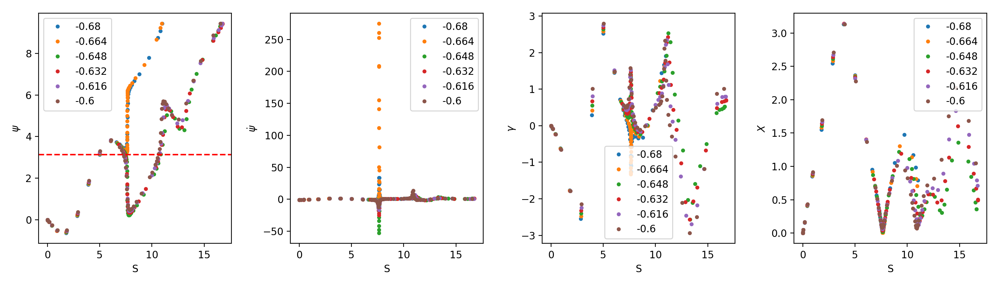

In [139]:
Sb = -0.5
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.
U0_list = np.linspace(-0.68, -0.6, 6)

sols = []
for U0 in U0_list:

    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    print(U0, sol.t_events)  
    sols.append(sol)
plot_solution(sols, U0_list)

In [178]:
Sb = -0.5
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 9

U0_1 = -0.66
U0_2 = -0.68

while abs(U0_2 - U0_1) > 1e-13:
    
    U0 = (U0_1 + U0_2)/2
    
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1),y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    
    # Criteria: 
    if len(sol.t_events[0]) > 1:
        U0_1 = U0
    else: 
        U0_2 = U0
U0

-0.661554195917779

/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


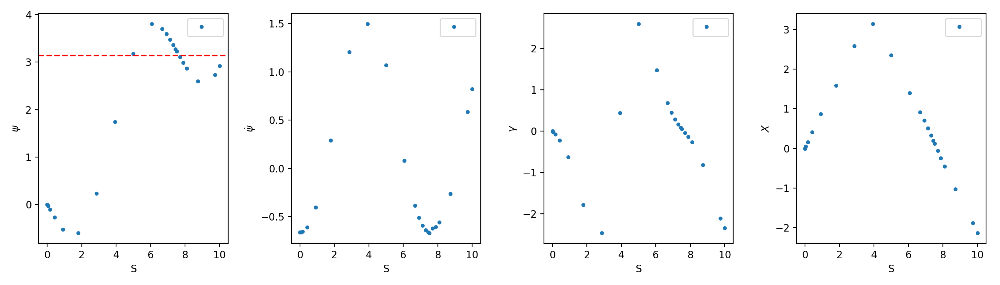

In [181]:
Sb = -0.5
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 10
U0 = -0.661554195917779

sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 

plot_solution([sol], [None])
# plt.savefig('sol1.png', dpi=300)

/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


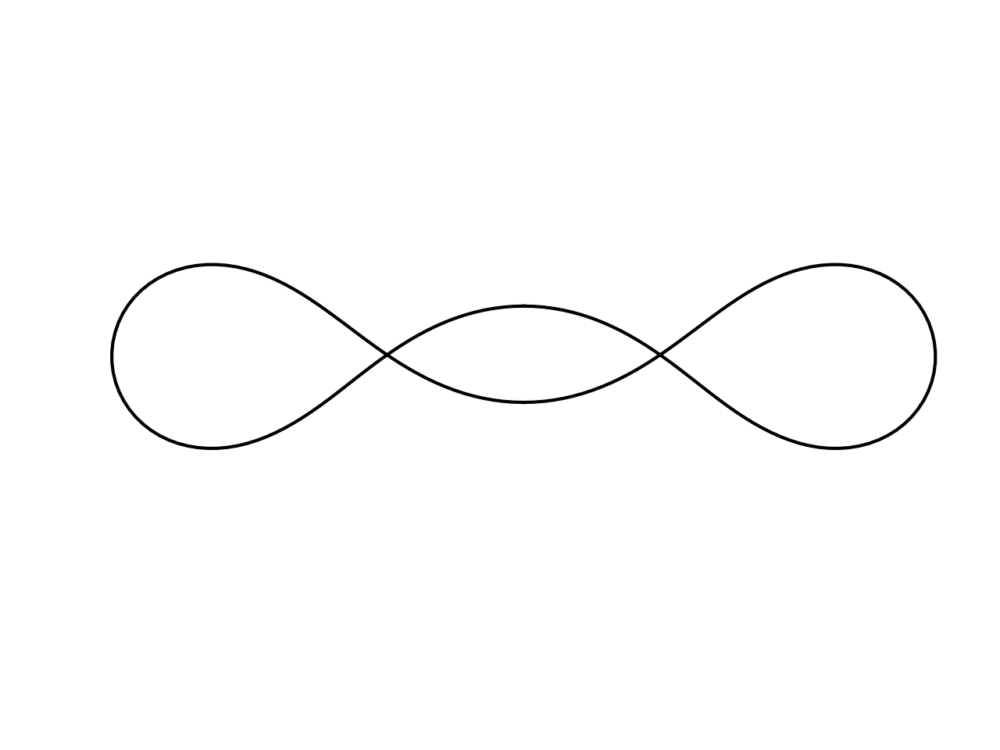

In [182]:
plt.figure()
plot_contour(generate_contour(sol))
plt.tight_layout()
plt.savefig('shape1.png', dpi=300)

0.57 [array([ 3.40114871,  5.62531547, 12.81403917]), array([18.12321538]), array([], dtype=float64)]
0.574 [array([ 3.39626915,  5.62600968, 12.77177941]), array([18.12534091]), array([], dtype=float64)]
0.578 [array([ 3.39140228,  5.65220811, 12.82389547]), array([18.28511878]), array([], dtype=float64)]
0.582 [array([3.386502]), array([12.85704955]), array([], dtype=float64)]
0.586 [array([3.38162393]), array([12.86950401]), array([], dtype=float64)]
0.59 [array([3.37673691]), array([12.86977086]), array([], dtype=float64)]


/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


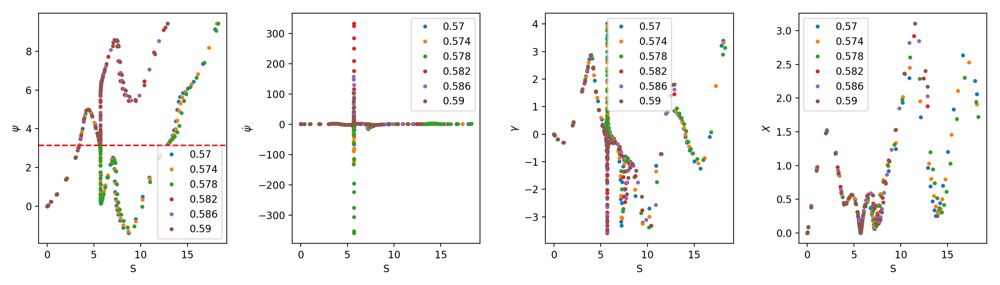

In [165]:
Sb = -0.5
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 40.
U0_list = np.linspace(0.57, 0.59, 6)

sols = []
for U0 in U0_list:

    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    print(U0, sol.t_events)  
    sols.append(sol)
plot_solution(sols, U0_list)

In [173]:
Sb = -0.5
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 10

U0_1 = 0.5802963
U0_2 = 0.5802964

while abs(U0_2 - U0_1) > 1e-14:
    
    U0 = (U0_1 + U0_2)/2
    
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1),y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    
    # Criteria: 
    if len(sol.t_events[0]) > 1:
        U0_1 = U0
    else: 
        U0_2 = U0
U0

0.5802963392822205

/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


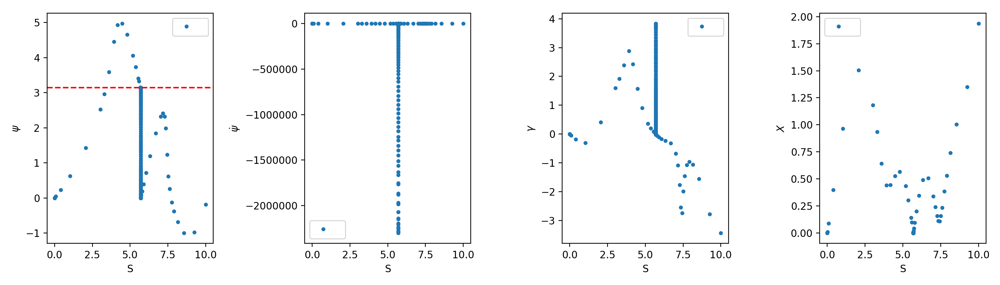

In [183]:
Sb = -0.5
Pb = 1.
C0 = 0.

S0 = 1e-7
S1 = 10
U0 = 0.5802963392822205

sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 

plot_solution([sol], [None])
plt.savefig('sol2.png', dpi=300)

/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


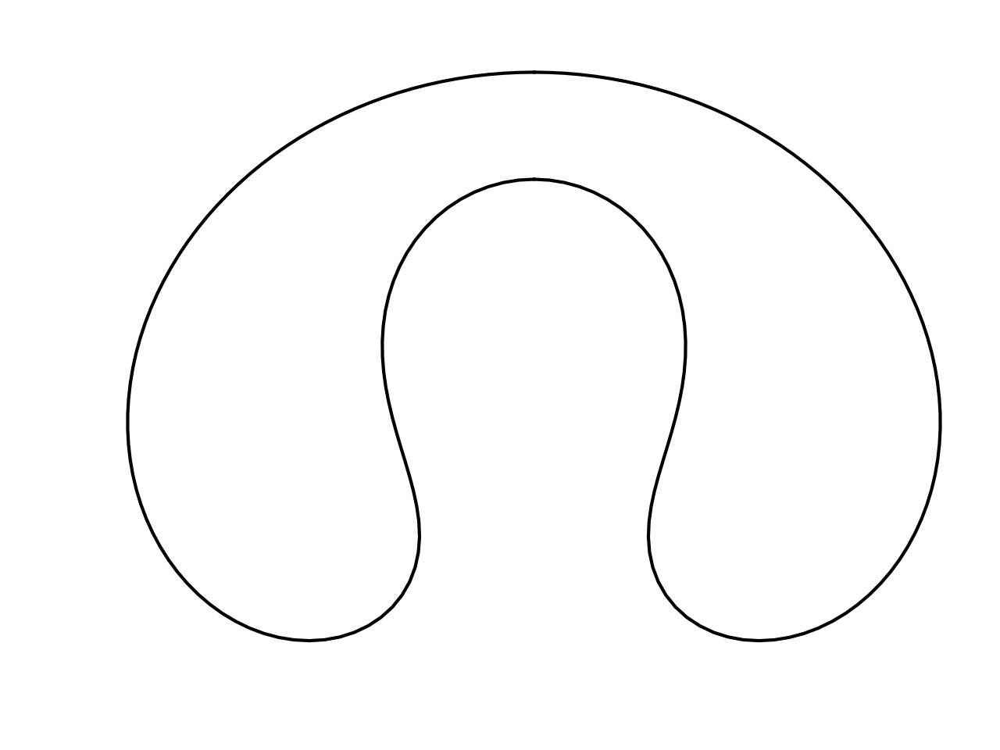

In [184]:
plt.figure()
plot_contour(generate_contour(sol))
plt.tight_layout()
plt.savefig('shape2.png', dpi=300)

(378,) (378,) (378, 4)
(377,) (377,) (377, 4)
(377,) (377,) (377, 4)


/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


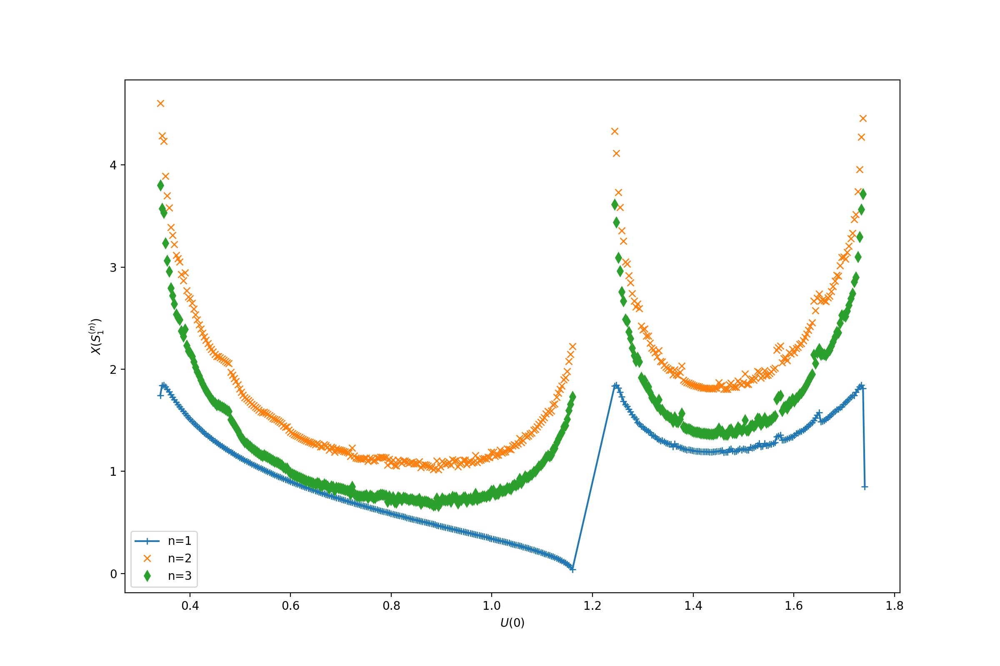

In [191]:
Sb = 1.1
Pb = -1.
C0 = 1.27

S0 = 1e-7
S1 = 100
U0_list = np.linspace(0.25, 2, 501)

sols = []
for U0 in U0_list:
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi])
    sols.append(sol)

U0_n_geq1 = np.array([U0 for sol, U0 in zip(sols, U0_list) if len(sol.t_events[0]) > 0])
U0_n_geq2 = np.array([U0 for sol, U0 in zip(sols, U0_list) if len(sol.t_events[0]) > 1]) 
U0_n_geq3 = np.array([U0 for sol, U0 in zip(sols, U0_list) if len(sol.t_events[0]) > 2]) 

S1_n_geq1 = np.array([sol.t_events[0] for sol in sols if len(sol.t_events[0]) > 0])
S1_n_geq2 = np.array([sol.t_events[0] for sol in sols if len(sol.t_events[0]) > 1])
S1_n_geq3 = np.array([sol.t_events[0] for sol in sols if len(sol.t_events[0]) > 2])

y_n_geq1 = np.array([sol.sol(sol.t_events[0])[:, 0] for sol in sols if len(sol.t_events[0]) > 0])
y_n_geq2 = np.array([sol.sol(sol.t_events[0])[:, 1] for sol in sols if len(sol.t_events[0]) > 1])
y_n_geq3 = np.array([sol.sol(sol.t_events[0])[:, 2] for sol in sols if len(sol.t_events[0]) > 2])

print(U0_n_geq1.shape, S1_n_geq1.shape, y_n_geq1.shape)
print(U0_n_geq2.shape, S1_n_geq2.shape, y_n_geq2.shape)
print(U0_n_geq3.shape, S1_n_geq3.shape, y_n_geq3.shape)


plt.figure(figsize=(12, 8))
plt.plot(U0_n_geq1, y_n_geq1[:, 3], '+-', label='n=1')
plt.plot(U0_n_geq2, y_n_geq2[:, 3], 'x', label='n=2')
plt.plot(U0_n_geq3, y_n_geq3[:, 3], 'd', label='n=3')
plt.xlabel(r'$U(0)$')
plt.ylabel(r'$X(S_1^{(n)})$')
plt.legend()
plt.show()

1.7 [array([ 6.78736948, 10.4056393 , 11.67421213, 12.8512691 , 13.66325457,
       14.37986007, 14.93218034, 15.40931643, 15.79277307, 16.12113776,
       16.39012942, 16.61927746, 16.80890048, 16.9698607 , 17.10383846,
       17.21726794, 17.31202178, 17.39208644, 17.45912146, 17.51568093,
       17.56310594, 17.60307522, 17.63662155, 17.66487   , 17.68859361,
       17.70855752, 17.7253171 , 17.73941719, 17.75126296, 17.7612209 ,
       17.76958168, 17.77660878, 17.78251158, 17.78747208, 17.79163773,
       17.79513719, 17.79807564, 17.80054372, 17.80261614, 17.80435673,
       17.8058184 , 17.80704606, 17.80807713, 17.80894321, 17.80967071,
       17.81028188, 17.81079536, 17.81122681, 17.81158936, 17.81189405,
       17.81215014, 17.81236541, 17.81254638, 17.81269854, 17.81282649,
       17.81293408, 17.81302459, 17.81310071, 17.81316476, 17.81321865,
       17.813264  , 17.81330216, 17.81333429, 17.81336133, 17.8133841 ,
       17.81340328, 17.81341942, 17.81343302, 17.81344448, 

1.76 [array([], dtype=float64), array([], dtype=float64), array([], dtype=float64)]
1.78 [array([], dtype=float64), array([], dtype=float64), array([], dtype=float64)]
1.8 [array([], dtype=float64), array([], dtype=float64), array([], dtype=float64)]


/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


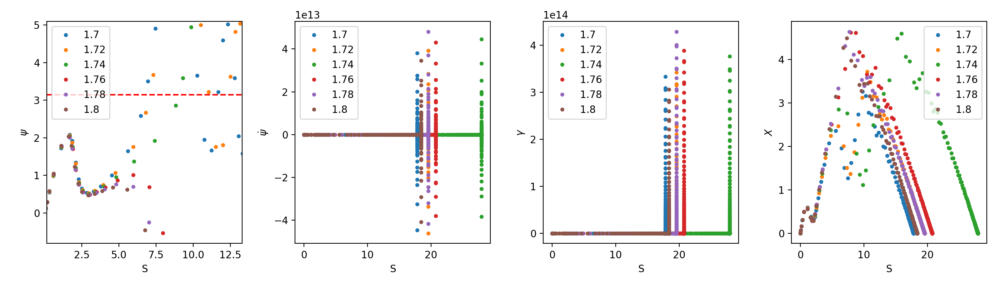

In [193]:
Sb = 1.1
Pb = -1.
C0 = 1.27

S0 = 1e-7
S1 = 40.
U0_list = np.linspace(1.7, 1.8, 6)

sols = []
for U0 in U0_list:

    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    print(U0, sol.t_events)  
    sols.append(sol)
plot_solution(sols, U0_list)

In [194]:
Sb = 1.1
Pb = -1.
C0 = 1.27

S0 = 1e-7
S1 = 10

U0_1 = 1.74
U0_2 = 1.76

while abs(U0_2 - U0_1) > 1e-13:
    
    U0 = (U0_1 + U0_2)/2
    
    sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1),y0(S0, U0, Sb, C0), method='RK45', 
                    dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 
    
    # Criteria: 
    if len(sol.t_events[0]) > 0:
        U0_1 = U0
    else: 
        U0_2 = U0
U0

1.7408979965002072

/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


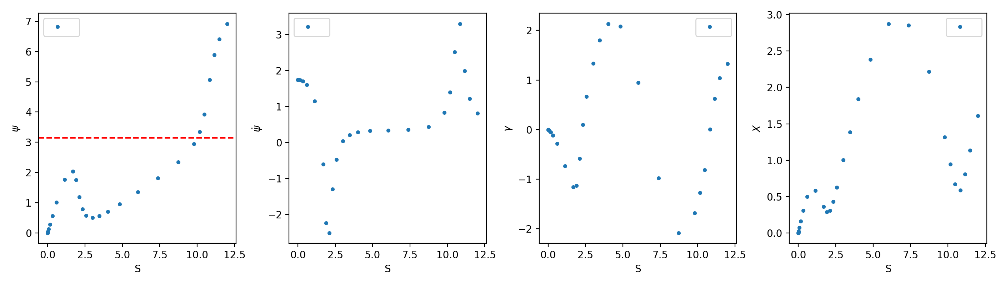

In [196]:
Sb = 1.1
Pb = -1.
C0 = 1.27

S0 = 1e-7
S1 = 12
U0 = 1.7408979965002072

sol = solve_ivp(lambda S, y: shape_func(S, y, Sb, Pb, C0), (S0, S1), y0(S0, U0, Sb, C0), method='RK45', 
                dense_output=True, events=[psi_reach_pi, psi_reach_3pi, psi_reach_minus_2pi]) 

plot_solution([sol], [None])
# plt.savefig('sol2.png', dpi=300)

/Users/rfang/anaconda/envs/snakes/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


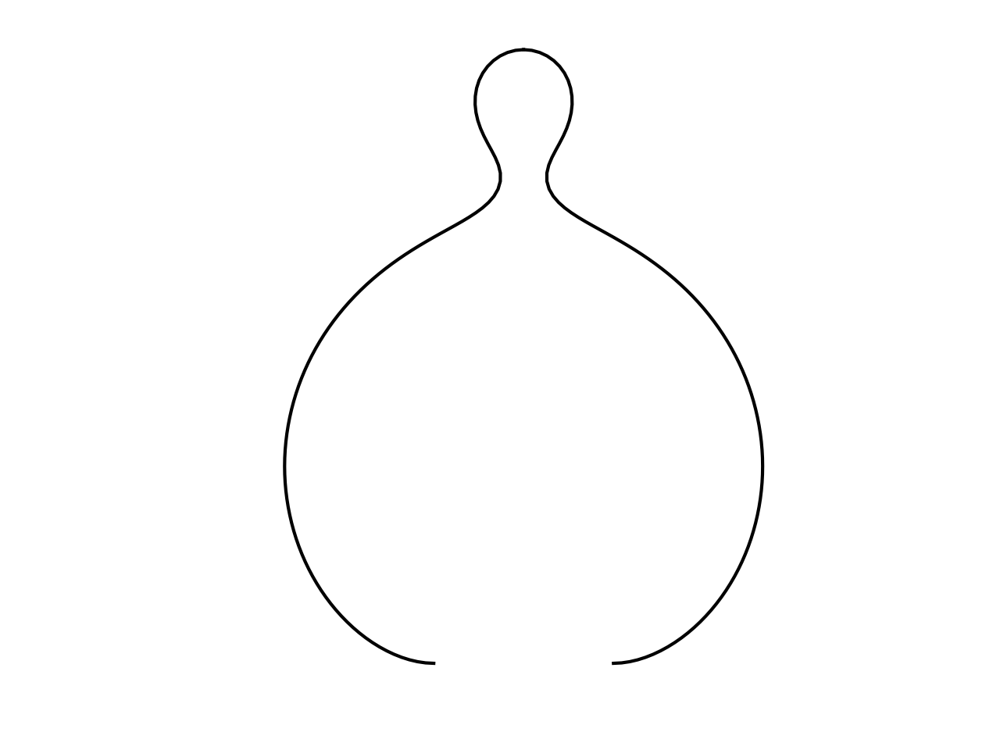

In [197]:
plt.figure()
plot_contour(generate_contour(sol))
plt.tight_layout()
# plt.savefig('shape2.png', dpi=300)

0. Dynamics? What is the physical interpretation of dS? 
1. Singularity at boundaries. Is there an obvious way to remove the singularity? Or, is it valid to use very small X to approximate X=0 at the boundaries? How small should we use? 
2. Which integration method to use: 'RK45', 'RK23', 'Radau', 'BDF'
3. How to perform extrapolation by looking at figure 16? How to automate this process?  
4. Shooting method: how to find optimal U0, U1, S1? Gridsearch? 
5. How to construct the shape given solutions? Integrate to find Z(S), plot curve (X, Z)

To do: 
- criteria of binary search 
- which are solutions and which are not? how do we know 
- read paper about saddle point 